# 1.3 Gradient Descent for Temperatures

## 1. Importing Libraries and Data
## 2. Gradient Descent
### 2.1 Year 1960
### 2.2 Heathrow, 1960
### 2.3 Rome, 1960
### 2.4 Stockholm, 1960
### 2.5 Year 1990
### 2.6 Heathrow, 1990
### 2.7 Rome, 1990
### 2.8 Stockholm, 1990
### 2.9 Year 2020
### 2.10 Heathrow, 2020
### 2.11 Rome, 2020
### 2.12 Stockholm, 2020

In [481]:
# Importing Libraries
import pandas as pd
import plotly.express as px
import numpy as np
import matplotlib.pyplot as plt
import os
from mpl_toolkits import mplot3d

from plotly.offline import download_plotlyjs, init_notebook_mode
from plotly.offline import plot, iplot
import plotly.graph_objects as go

In [482]:
# Import dataset
path = r'/Users/daxma/OneDrive/Desktop/Data Analytics/Machine Learning with Python/Achievement 1/07-25 ClimateWins Analysis/02 Data'
climate = pd.read_csv(os.path.join(path, 'Prepared Data', 'weather_prediction_scaled_new.csv'))

In [483]:
# Check output 
climate.head()

,Unnamed: 0,DATE,MONTH,BASEL_cloud_cover,BASEL_wind_speed,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_snow_depth,...,VALENTIA_cloud_cover,VALENTIA_humidity,VALENTIA_pressure,VALENTIA_global_radiation,VALENTIA_precipitation,VALENTIA_snow_depth,VALENTIA_sunshine,VALENTIA_temp_mean,VALENTIA_temp_min,VALENTIA_temp_max
0,0,19600101,1,0.660514,-0.02793,0.826097,-0.001949,-1.101066,-0.265148,-0.179228,...,-0.443701,0.761754,-1.299744,-0.806427,-0.088407,-0.024706,0.372147,-0.668215,-0.519743,-0.752237
1,1,19600102,1,0.244897,-0.02793,0.735760,-0.001949,-1.058108,1.658760,-0.179228,...,0.783085,1.183580,-1.262455,-1.042055,0.503361,-0.024706,-0.829285,-0.548046,-0.629054,-0.407141
2,2,19600103,1,1.076130,-0.02793,1.277781,-0.001949,-1.251420,0.155707,-0.179228,...,0.783085,1.183580,-0.432779,-1.136306,-0.396127,-0.024706,-1.009500,-0.067372,0.054135,-0.177078
3,3,19600104,1,-1.001953,-0.02793,1.458455,-0.001949,-0.821838,-0.445514,-0.179228,...,0.783085,0.480538,0.387574,-1.183432,0.669056,-0.024706,-1.039536,-0.998679,-0.164486,-0.838511
4,4,19600105,1,0.244897,-0.02793,1.729466,-0.001949,-0.746661,-0.164944,-0.179228,...,-1.670486,-0.363113,1.729970,-0.794645,-0.490810,-0.024706,0.672505,-1.509396,-1.339569,-1.471186


## 2. Gradient Descent

In [485]:
#Reduce to just the mean temperatures
df = climate[['DATE', 'MONTH','BASEL_temp_mean',
 'BELGRADE_temp_mean',
 'BUDAPEST_temp_mean',
 'DEBILT_temp_mean',
 'DUSSELDORF_temp_mean',
 'GDANSK_temp_mean',
 'HEATHROW_temp_mean',
 'KASSEL_temp_mean',
 'LJUBLJANA_temp_mean',
 'MAASTRICHT_temp_mean',
 'MADRID_temp_mean',
 'MUNCHENB_temp_mean',
 'OSLO_temp_mean',
 'ROMA_temp_mean',
 'SONNBLICK_temp_mean',
 'STOCKHOLM_temp_mean',
 'TOURS_temp_mean',
 'VALENTIA_temp_mean']].copy()

In [486]:
df

,DATE,MONTH,BASEL_temp_mean,BELGRADE_temp_mean,BUDAPEST_temp_mean,DEBILT_temp_mean,DUSSELDORF_temp_mean,GDANSK_temp_mean,HEATHROW_temp_mean,KASSEL_temp_mean,LJUBLJANA_temp_mean,MAASTRICHT_temp_mean,MADRID_temp_mean,MUNCHENB_temp_mean,OSLO_temp_mean,ROMA_temp_mean,SONNBLICK_temp_mean,STOCKHOLM_temp_mean,TOURS_temp_mean,VALENTIA_temp_mean
0,19600101,1,-0.528623,-1.016876,-1.099163,-0.114356,-0.105836,-0.927601,-0.106469,-0.182904,-1.370824,-0.097084,-0.988280,-0.265742,-0.186575,-1.280450,-0.124331,-0.391072,-0.257321,-0.668215
1,19600102,1,-0.582946,-1.107669,-1.110927,-0.367511,-0.370915,-0.825294,-0.892676,-0.212437,-1.043881,-0.232112,-0.691740,-0.353714,-0.368598,-0.539569,-0.650834,-0.415953,-0.335759,-0.548046
2,19600103,1,-0.257010,-1.084971,-1.063873,-0.509912,-0.532908,-0.940389,-0.490837,-0.389635,-0.741156,-0.487164,-0.853490,-0.403983,-0.550620,-0.876333,-0.650834,-0.615003,-0.210258,-0.067372
3,19600104,1,-0.555784,-1.209812,-1.146217,-0.525734,-0.577088,-1.042696,-0.316124,-0.493001,-0.910682,-0.472161,-0.624345,-0.642763,-0.417137,-0.775304,-0.943336,-0.764290,-0.069069,-0.998679
4,19600105,1,-1.003946,-1.209812,-1.087400,-0.320045,-0.444548,-0.978754,-0.403481,-0.552067,-0.862246,-0.307127,-0.381721,-0.906678,-0.332193,-0.926848,-0.621584,-0.503037,-0.037694,-1.509396
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22945,20221027,10,0.747959,0.628750,-0.005167,0.898267,1.042841,0.440753,0.906865,-0.005705,0.481853,1.268193,0.683127,0.664244,0.395898,-0.000746,0.826301,0.517090,1.295755,-0.007287
22946,20221028,10,0.856604,0.367720,-0.005167,0.945734,1.278467,0.466330,0.802037,-0.005705,0.263891,1.313202,0.561815,0.890456,0.541516,-0.000746,1.074927,0.641496,1.358505,-0.007287
22947,20221029,10,0.856604,0.083991,-0.005167,0.914089,1.101748,0.786039,0.924336,-0.005705,0.300218,1.208181,0.548336,1.053832,0.395898,-0.000746,1.221178,0.716139,1.405568,-0.007287
22948,20221030,10,0.680055,0.265577,-0.005167,0.692578,0.880848,0.376811,0.697210,-0.005705,0.397090,0.923123,0.103526,0.689378,-0.065226,-0.000746,1.235803,0.019467,0.668249,-0.007287


In [487]:
#Drop the DATE and MONTH data as those numbers are not scaled with the rest.
notemp = df.drop(['DATE','MONTH'], axis=1)

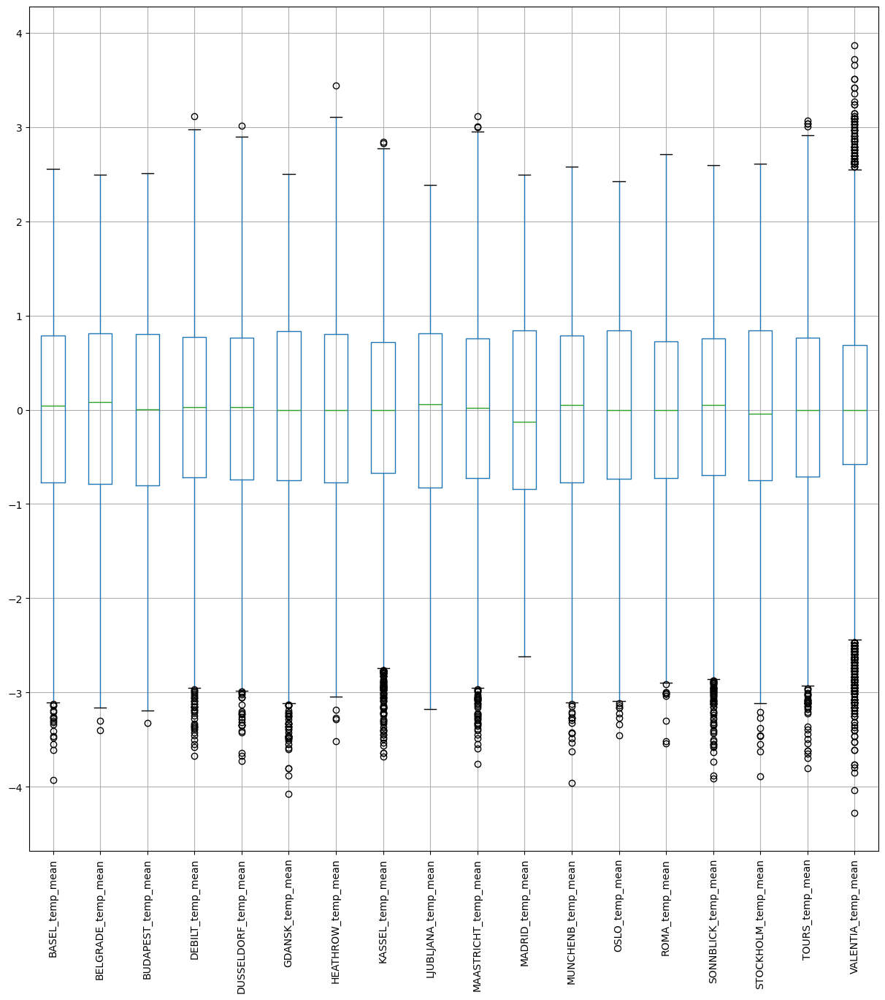

In [488]:
#Look at a whisker plot of the data to see variations in temperatures
notemp.boxplot(figsize=(15,15))
plt.xticks(rotation=90)
plt.show()

### 2.1 Year 1960

In [489]:
#Reduce your dataset to a single year
dfyear = df[df['DATE'].astype(str).str.contains('1960')]
dfyear

,DATE,MONTH,BASEL_temp_mean,BELGRADE_temp_mean,BUDAPEST_temp_mean,DEBILT_temp_mean,DUSSELDORF_temp_mean,GDANSK_temp_mean,HEATHROW_temp_mean,KASSEL_temp_mean,LJUBLJANA_temp_mean,MAASTRICHT_temp_mean,MADRID_temp_mean,MUNCHENB_temp_mean,OSLO_temp_mean,ROMA_temp_mean,SONNBLICK_temp_mean,STOCKHOLM_temp_mean,TOURS_temp_mean,VALENTIA_temp_mean
0,19600101,1,-0.528623,-1.016876,-1.099163,-0.114356,-0.105836,-0.927601,-0.106469,-0.182904,-1.370824,-0.097084,-0.988280,-0.265742,-0.186575,-1.280450,-0.124331,-0.391072,-0.257321,-0.668215
1,19600102,1,-0.582946,-1.107669,-1.110927,-0.367511,-0.370915,-0.825294,-0.892676,-0.212437,-1.043881,-0.232112,-0.691740,-0.353714,-0.368598,-0.539569,-0.650834,-0.415953,-0.335759,-0.548046
2,19600103,1,-0.257010,-1.084971,-1.063873,-0.509912,-0.532908,-0.940389,-0.490837,-0.389635,-0.741156,-0.487164,-0.853490,-0.403983,-0.550620,-0.876333,-0.650834,-0.615003,-0.210258,-0.067372
3,19600104,1,-0.555784,-1.209812,-1.146217,-0.525734,-0.577088,-1.042696,-0.316124,-0.493001,-0.910682,-0.472161,-0.624345,-0.642763,-0.417137,-0.775304,-0.943336,-0.764290,-0.069069,-0.998679
4,19600105,1,-1.003946,-1.209812,-1.087400,-0.320045,-0.444548,-0.978754,-0.403481,-0.552067,-0.862246,-0.307127,-0.381721,-0.906678,-0.332193,-0.926848,-0.621584,-0.503037,-0.037694,-1.509396
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
361,19601227,12,-1.289140,-1.277907,-1.440302,-1.126979,-0.974707,-0.940389,-1.469228,-0.891697,-1.721985,-0.997267,-1.069155,-1.120324,-0.417137,-1.785596,-0.914086,-0.403513,-1.104453,-1.629564
362,19601228,12,-1.289140,-1.255208,-1.416775,-1.522534,-1.283966,-0.978754,-1.469228,-1.054129,-1.479805,-1.342338,-1.338737,-1.321402,-0.550620,-1.381479,-1.279713,-0.565240,-1.653520,-1.509396
363,19601229,12,-1.207656,-1.221161,-1.122690,-1.570001,-1.313420,-1.234521,-1.434286,-1.305160,-1.443478,-1.342338,-0.920885,-1.459643,-0.708373,-1.819273,-1.659965,-0.615003,-1.073078,-0.998679
364,19601230,12,-1.547172,-1.243859,-1.169744,-1.316845,-1.372326,-0.889236,-1.084860,-1.393759,-1.273952,-1.177304,-0.772615,-1.547614,-0.829722,-1.549861,-1.674591,-0.726968,-0.900514,-1.239016


In [490]:
dfyear.describe()

,DATE,MONTH,BASEL_temp_mean,BELGRADE_temp_mean,BUDAPEST_temp_mean,DEBILT_temp_mean,DUSSELDORF_temp_mean,GDANSK_temp_mean,HEATHROW_temp_mean,KASSEL_temp_mean,LJUBLJANA_temp_mean,MAASTRICHT_temp_mean,MADRID_temp_mean,MUNCHENB_temp_mean,OSLO_temp_mean,ROMA_temp_mean,SONNBLICK_temp_mean,STOCKHOLM_temp_mean,TOURS_temp_mean,VALENTIA_temp_mean
count,3.660000e+02,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000
mean,1.960067e+07,6.513661,-0.102317,-0.032384,-0.063919,-0.052666,-0.034416,-0.067706,-0.103366,0.026208,-0.074499,-0.063840,-0.130480,-0.101680,-0.078422,0.092554,-0.175958,-0.092804,-0.059940,-0.057276
std,3.457653e+02,3.455958,0.935826,0.920271,0.946637,0.910451,0.919531,0.978767,0.919195,0.964448,0.906193,0.902235,0.979590,0.938523,0.998018,1.002362,0.884235,0.988702,0.944029,1.127911
min,1.960010e+07,1.000000,-3.190431,-2.401472,-2.416664,-2.645913,-2.874442,-2.922584,-2.307849,-3.446307,-2.714923,-3.247725,-2.322710,-3.017997,-2.249500,-2.408610,-3.502727,-2.356684,-3.112470,-2.951420
25%,1.960040e+07,4.000000,-0.756099,-0.594120,-0.675681,-0.668134,-0.661766,-0.825294,-0.840262,-0.666507,-0.738129,-0.712209,-0.890557,-0.777863,-0.738711,-0.653227,-0.764178,-0.798501,-0.692653,-0.848468
50%,1.960070e+07,7.000000,-0.053300,0.055618,-0.005167,-0.011511,-0.002750,-0.096358,-0.071526,0.082894,-0.002507,0.052946,-0.294107,-0.001827,-0.168373,-0.009165,-0.124331,-0.179582,0.032900,-0.037330
75%,1.960098e+07,9.750000,0.649499,0.662798,0.744750,0.692578,0.715174,0.757265,0.714681,0.802762,0.699815,0.649317,0.787590,0.626541,0.869157,1.110576,0.475298,0.877867,0.683937,0.893978
max,1.960123e+07,12.000000,1.820830,1.843109,1.806397,1.847601,1.970619,1.834684,1.745486,2.002543,1.668536,1.688278,1.936682,1.858144,1.985564,1.952486,1.967058,1.686504,1.938947,2.606381


In [491]:
#Drop the DATE and MONTH data as those numbers are not scaled with the rest.
notempyear = dfyear.drop(['DATE','MONTH'], axis=1)

In [492]:
#Plot ALL weather data for all stations for a year 

#X = weather station
#Y = day of the year
#Z = temperature


import plotly.offline as pyo
pyo.init_notebook_mode(connected=True)

fig = go.Figure(data=[go.Surface(z=notempyear.values)])
fig.update_layout(title='Temperatures over time', autosize=False, width=600, height=600)

pyo.iplot(fig)

In [493]:
#We need to make an index for the year. Create a set of data from 1 to 365 (or to 366 if it's a leap year!)
#We'll scale this by 100 as the index is made. This will help the gradient descent converge 366 = 3.66

i = np.arange(0.01,3.67,0.01) #<---needs to be one GREATER than the total number of days
index = pd.DataFrame(data = i, columns = ['index'])
index

,index
0,0.01
1,0.02
2,0.03
3,0.04
4,0.05
...,...
361,3.62
362,3.63
363,3.64
364,3.65


In [494]:
n_rows = dfyear.shape[0]
n_rows

366

### 2.2 Heathrow, 1960

In [496]:
#This will translate your chosen weather data into the X and y datasets needed for the optimization function.

X=index.to_numpy().reshape(n_rows,1)
#Represent x_0 as a vector of 1s for vector computation
ones = np.ones((n_rows,1))
X = np.concatenate((ones, X), axis=1)
y=dfyear['HEATHROW_temp_mean'].to_numpy().reshape(n_rows,1)

In [497]:
X.shape, y.shape

((366, 2), (366, 1))

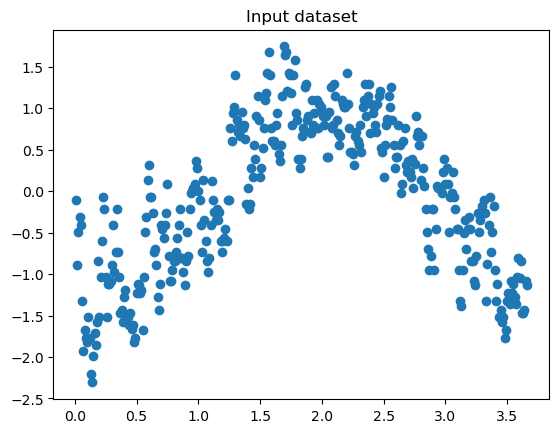

In [498]:
#Look at one year of temperature data over time
plt.scatter(x=index['index'], y=dfyear['HEATHROW_temp_mean'])
plt.title('Input dataset');
plt.show()

In [499]:
# Find min temperature
dfyear['HEATHROW_temp_mean'].min()

-2.307849033037666

In [500]:
# Find max temperature
dfyear['HEATHROW_temp_mean'].max()

1.7454857532917796

In [501]:
# Compute loss function for the gradiant descent

def compute_cost(X, y, theta=np.array([[0],[0]])):
    """Given covariate matrix X, the prediction results y and coefficients theta
    compute the loss"""
    
    m = len(y)
    J=0 # initialize loss to zero
    
    # reshape theta
    theta=theta.reshape(2,1)
    
    # calculate the hypothesis - y_hat
    h_x = np.dot(X,theta)
    #print(h_x)
    
    # subtract y from y_hat, square and sum
    error_term = sum((h_x - y)**2)
    
    # divide by twice the number of samples - standard practice.
    loss = error_term/(2*m)
    
    return loss

In [502]:
compute_cost(X,y)

array([0.42664811])

In [503]:
# Gradient descent function

def gradient_descent(X, y, theta=np.array([[0],[0]]),
                    alpha=0.01, num_iterations=1500):
    """
    Solve for theta using Gradient Descent optimiztion technique. 
    Alpha is the learning rate
    """
    m = len(y)
    J_history = []
    theta0_history = []
    theta1_history = []
    theta = theta.reshape(2,1)
    
    for i in range(num_iterations):
        error = (np.dot(X, theta) - y)
        
        term0 = (alpha/m) * sum(error* X[:,0].reshape(m,1))
        term1 = (alpha/m) * sum(error* X[:,1].reshape(m,1))
        
        # update theta
        term_vector = np.array([[term0],[term1]])
        #print(term_vector)
        theta = theta - term_vector.reshape(2,1)
        
        # store history values
        theta0_history.append(theta[0].tolist()[0])
        theta1_history.append(theta[1].tolist()[0])
        J_history.append(compute_cost(X,y,theta).tolist()[0])
        
    return (theta, J_history, theta0_history, theta1_history)

In [504]:
%%time
#This runs the data through a gradiant descent for the starting conditions in 'theta_init.'

num_iterations= 500 
theta_init=np.array([[1],[1]]) 
alpha=0.01 
theta, J_history, theta0_history, theta1_history = gradient_descent(X,y, theta_init,
                                                                   alpha, num_iterations)

CPU times: total: 562 ms
Wall time: 691 ms


In [505]:
theta

array([[-0.10211506],
       [ 0.03483082]])

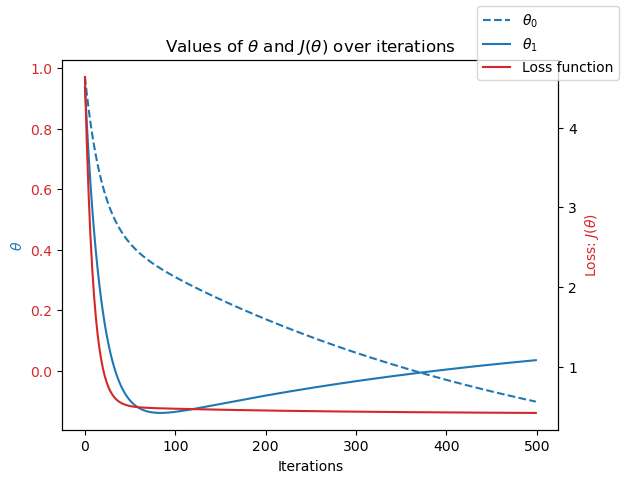

In [506]:
plt.close('all')

fig, ax1 = plt.subplots()

# plot thetas over time
color='tab:blue'
ax1.plot(theta0_history, label='$\\theta_{0}$', linestyle='--', color=color)
ax1.plot(theta1_history, label='$\\theta_{1}$', linestyle='-', color=color)
# ax1.legend()
ax1.set_xlabel('Iterations'); ax1.set_ylabel('$\\theta$', color=color);
ax1.tick_params(axis='y', labelcolor=color)

# plot loss function over time
color='tab:red'
ax2 = ax1.twinx()
ax2.plot(J_history, label='Loss function', color=color)
ax2.set_title('Values of $\\theta$ and $J(\\theta)$ over iterations')
ax2.set_ylabel('Loss: $J(\\theta)$', color=color)
ax1.tick_params(axis='y', labelcolor=color)

# ax2.legend();
fig.legend();

plt.show()

In [507]:
%%time
# theta range
theta0_vals = np.linspace(-10,10,100) 
theta1_vals = np.linspace(-10,10,100) 
                                     
J_vals = np.zeros((len(theta0_vals), len(theta1_vals)))

# compute cost for each combination of theta
c1=0; c2=0
for i in theta0_vals:
    for j in theta1_vals:
        t = np.array([i, j])
        J_vals[c1][c2] = compute_cost(X, y, t.transpose()).tolist()[0]
        c2=c2+1
    c1=c1+1
    c2=0 # reinitialize to 0

CPU times: total: 3.77 s
Wall time: 3.8 s


In [508]:
#Show loss function.

#X = Theta0
#Y - Theta1
#Z = Loss

#you can click/hold in the graph below to rotate!

fig = go.Figure(data=[go.Surface(x=theta1_vals, y=theta0_vals, z=J_vals)])
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

In [509]:
#Here is the same figure as above, with the line the loss function takes toward the minimum.

#X = Theta0
#Y - Theta1
#Z = Loss
#black line = path of loss function over the iterations.
#Find where it is closest to 0 in X and Y!

#you can click/hold in the graph below to rotate!

line_marker = dict(color='#101010', width=2)
fig = go.Figure()
fig.add_surface(x=theta1_vals, y=theta0_vals, z=J_vals)
fig.add_scatter3d(x=theta1_history, y=theta0_history, z=J_history, line=line_marker, name='')
#The below line adds a graph of just the loss over iterations in a 2D plane
plt.plot(theta0_history, theta1_history, 'r+');
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

In [510]:
#Rerun the optimisation above closer to the objective


num_iterations=500
theta_init=np.array([[-0.12],[0.26]])
alpha= 0.01 
theta1, J_history1, theta0_history1, theta1_history1 = gradient_descent(X,y, theta_init,
                                                                   alpha, num_iterations)

In [511]:
# New loss path on the function

line_marker = dict(color='#101010', width=2)
fig = go.Figure()
fig.add_surface(x=theta1_vals, y=theta0_vals, z=J_vals)
fig.add_scatter3d(x=theta1_history1, y=theta0_history1, z=J_history1, line=line_marker, name='')
#The below line adds a graph of just the loss over iterations in a 2D plane
plt.plot(theta0_history1, theta1_history1, 'r+');
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

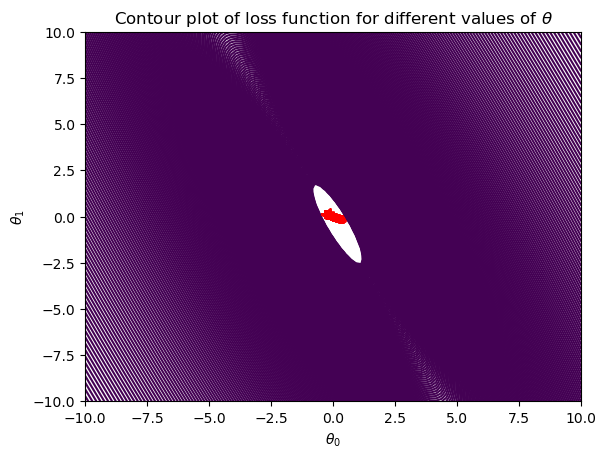

In [512]:
T0, T1 = np.meshgrid(theta0_vals, theta1_vals)  # Create 2D grid

plt.contour(T0, T1, J_vals, levels=np.logspace(0, 10, 1000))
plt.xlabel(r'$\theta_{0}$')
plt.ylabel(r'$\theta_{1}$')
plt.title("Contour plot of loss function for different values of $\\theta$")
plt.plot(theta0_history1, theta1_history1, 'r+')
plt.show()


#### Gradient descent in this case converged effectively, reaching the loss minimum in a smooth and stable manner. However, the amount of adjustment needed between different weather stations and years would depend on the scale and distribution of their respective data. If feature distributions change significantly, the initial values of θ, the learning rate, and the number of iterations may need to be re-tuned to ensure consistent convergence.

### 2.3 Rome, 1960

In [515]:
#This will translate your chosen weather data into the X and y datasets needed for the optimization function.

X=index.to_numpy().reshape(n_rows,1)
#Represent x_0 as a vector of 1s for vector computation
ones = np.ones((n_rows,1))
X = np.concatenate((ones, X), axis=1)
y=dfyear['ROMA_temp_mean'].to_numpy().reshape(n_rows,1)

In [516]:
X.shape, y.shape

((366, 2), (366, 1))

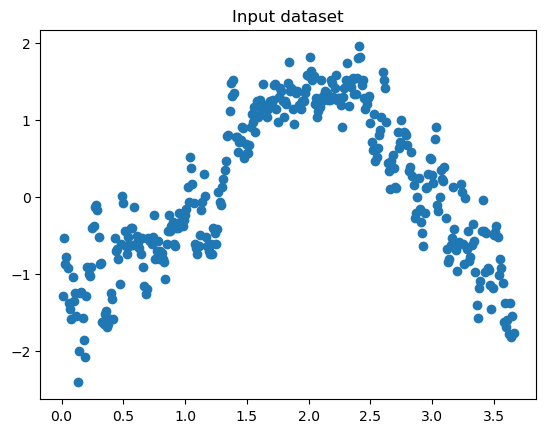

In [517]:
#Look at one year of temperature data over time
plt.scatter(x=index['index'], y=dfyear['ROMA_temp_mean'])
plt.title('Input dataset');
plt.show()


In [518]:
# Find min temperature
dfyear['ROMA_temp_mean'].min()


-2.4086101755628477

In [519]:
# Find max temperature
dfyear['ROMA_temp_mean'].max()


1.9524861813880556

In [520]:
# Compute loss function for the gradiant descent

def compute_cost(X, y, theta=np.array([[0],[0]])):
    """Given covariate matrix X, the prediction results y and coefficients theta
    compute the loss"""
    
    m = len(y)
    J=0 # initialize loss to zero
    
    # reshape theta
    theta=theta.reshape(2,1)
    
    # calculate the hypothesis - y_hat
    h_x = np.dot(X,theta)
    #print(h_x)
    
    # subtract y from y_hat, square and sum
    error_term = sum((h_x - y)**2)
    
    # divide by twice the number of samples - standard practice.
    loss = error_term/(2*m)
    
    return loss

In [521]:
compute_cost(X,y)

array([0.5052758])

In [522]:
# Gradient descent function

def gradient_descent(X, y, theta=np.array([[0],[0]]),
                    alpha=0.01, num_iterations=1500):
    """
    Solve for theta using Gradient Descent optimiztion technique. 
    Alpha is the learning rate
    """
    m = len(y)
    J_history = []
    theta0_history = []
    theta1_history = []
    theta = theta.reshape(2,1)
    
    for i in range(num_iterations):
        error = (np.dot(X, theta) - y)
        
        term0 = (alpha/m) * sum(error* X[:,0].reshape(m,1))
        term1 = (alpha/m) * sum(error* X[:,1].reshape(m,1))
        
        # update theta
        term_vector = np.array([[term0],[term1]])
        #print(term_vector)
        theta = theta - term_vector.reshape(2,1)
        
        # store history values
        theta0_history.append(theta[0].tolist()[0])
        theta1_history.append(theta[1].tolist()[0])
        J_history.append(compute_cost(X,y,theta).tolist()[0])
        
    return (theta, J_history, theta0_history, theta1_history)

In [523]:
%%time
#This runs the data through a gradiant descent for the starting conditions in 'theta_init.'

num_iterations= 500 
theta_init=np.array([[1],[1]]) 
alpha=0.05
theta, J_history, theta0_history, theta1_history = gradient_descent(X,y, theta_init,
                                                                   alpha, num_iterations)


CPU times: total: 484 ms
Wall time: 622 ms


In [524]:
theta

array([[-0.307254  ],
       [ 0.21834348]])

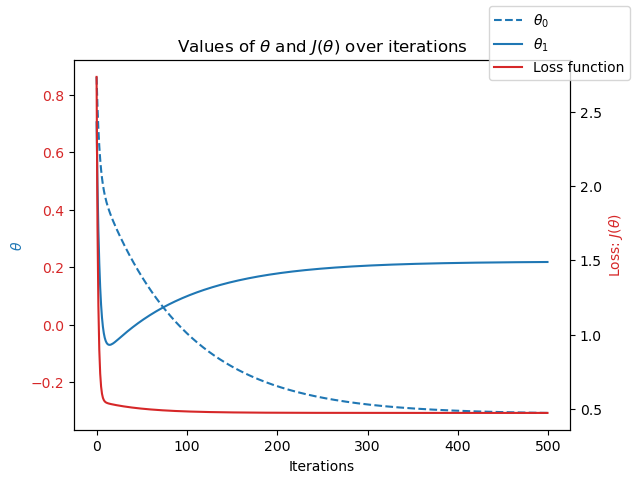

In [525]:
fig, ax1 = plt.subplots()

# plot thetas over time
color='tab:blue'
ax1.plot(theta0_history, label='$\\theta_{0}$', linestyle='--', color=color)
ax1.plot(theta1_history, label='$\\theta_{1}$', linestyle='-', color=color)
# ax1.legend()
ax1.set_xlabel('Iterations'); ax1.set_ylabel('$\\theta$', color=color);
ax1.tick_params(axis='y', labelcolor=color)

# plot loss function over time
color='tab:red'
ax2 = ax1.twinx()
ax2.plot(J_history, label='Loss function', color=color)
ax2.set_title('Values of $\\theta$ and $J(\\theta)$ over iterations')
ax2.set_ylabel('Loss: $J(\\theta)$', color=color)
ax1.tick_params(axis='y', labelcolor=color)

# ax2.legend();
fig.legend();

plt.show()


In [526]:
%%time
# theta range
theta0_vals = np.linspace(-10,10,100) 
theta1_vals = np.linspace(-10,10,100) 
                                     
J_vals = np.zeros((len(theta0_vals), len(theta1_vals)))

# compute cost for each combination of theta
c1=0; c2=0
for i in theta0_vals:
    for j in theta1_vals:
        t = np.array([i, j])
        J_vals[c1][c2] = compute_cost(X, y, t.transpose()).tolist()[0]
        c2=c2+1
    c1=c1+1
    c2=0 # reinitialize to 0


CPU times: total: 3.94 s
Wall time: 3.97 s


In [527]:
#Show loss function.

#X = Theta0
#Y - Theta1
#Z = Loss

#you can click/hold in the graph below to rotate!

fig = go.Figure(data=[go.Surface(x=theta1_vals, y=theta0_vals, z=J_vals)])
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

In [528]:
#Here is the same figure as above, with the line the loss function takes toward the minimum.

#X = Theta0
#Y - Theta1
#Z = Loss
#black line = path of loss function over the iterations.
#Find where it is closest to 0 in X and Y!

#you can click/hold in the graph below to rotate!

line_marker = dict(color='#101010', width=2)
fig = go.Figure()
fig.add_surface(x=theta1_vals, y=theta0_vals, z=J_vals)
fig.add_scatter3d(x=theta1_history, y=theta0_history, z=J_history, line=line_marker, name='')
#The below line adds a graph of just the loss over iterations in a 2D plane
plt.plot(theta0_history, theta1_history, 'r+');
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()


In [529]:
#Rerun the optimisation above closer to the objective


num_iterations=500
theta_init=np.array([[0],[0]])
alpha= 0.01 
theta1, J_history1, theta0_history1, theta1_history1 = gradient_descent(X,y, theta_init,
                                                                   alpha, num_iterations)


In [530]:
# New loss path on the function

line_marker = dict(color='#101010', width=2)
fig = go.Figure()
fig.add_surface(x=theta1_vals, y=theta0_vals, z=J_vals)
fig.add_scatter3d(x=theta1_history1, y=theta0_history1, z=J_history1, line=line_marker, name='')
#The below line adds a graph of just the loss over iterations in a 2D plane
plt.plot(theta0_history1, theta1_history1, 'r+');
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()


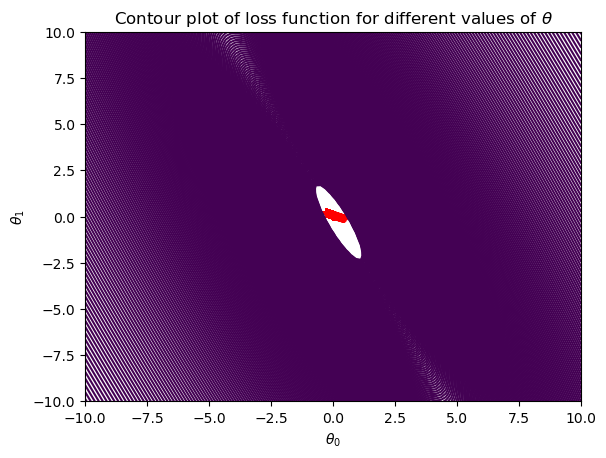

In [531]:
T0, T1 = np.meshgrid(theta0_vals, theta1_vals)  # Create 2D grid

plt.contour(T0, T1, J_vals, levels=np.logspace(0, 10, 1000))
plt.xlabel(r'$\theta_{0}$')
plt.ylabel(r'$\theta_{1}$')
plt.title("Contour plot of loss function for different values of $\\theta$")
plt.plot(theta0_history1, theta1_history1, 'r+')
plt.show()


### 2.4 Stockholm, 1960

In [533]:
#This will translate your chosen weather data into the X and y datasets needed for the optimization function.

X=index.to_numpy().reshape(n_rows,1)
#Represent x_0 as a vector of 1s for vector computation
ones = np.ones((n_rows,1))
X = np.concatenate((ones, X), axis=1)
y=dfyear['STOCKHOLM_temp_mean'].to_numpy().reshape(n_rows,1)

In [534]:
X.shape, y.shape

((366, 2), (366, 1))

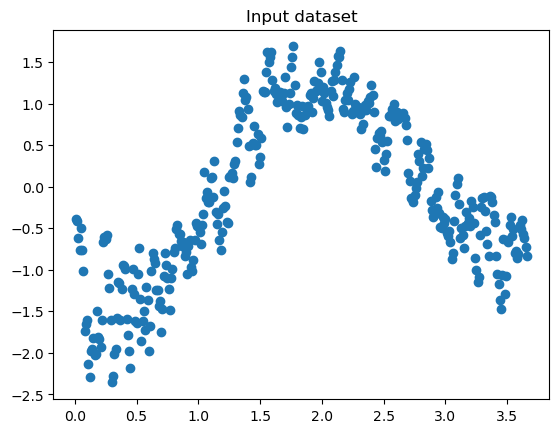

In [535]:
#Look at one year of temperature data over time
plt.scatter(x=index['index'], y=dfyear['STOCKHOLM_temp_mean'])
plt.title('Input dataset');
plt.show()


In [536]:
# Find min temperature
dfyear['STOCKHOLM_temp_mean'].min()

-2.356683584001993

In [537]:
# Find max temperature
dfyear['STOCKHOLM_temp_mean'].max()

1.6865044645383225

In [538]:
# Compute loss function for the gradiant descent

def compute_cost(X, y, theta=np.array([[0],[0]])):
    """Given covariate matrix X, the prediction results y and coefficients theta
    compute the loss"""
    
    m = len(y)
    J=0 # initialize loss to zero
    
    # reshape theta
    theta=theta.reshape(2,1)
    
    # calculate the hypothesis - y_hat
    h_x = np.dot(X,theta)
    #print(h_x)
    
    # subtract y from y_hat, square and sum
    error_term = sum((h_x - y)**2)
    
    # divide by twice the number of samples - standard practice.
    loss = error_term/(2*m)
    
    return loss

In [539]:
compute_cost(X,y)

array([0.49173644])

In [540]:
# Gradient descent function

def gradient_descent(X, y, theta=np.array([[0],[0]]),
                    alpha=0.01, num_iterations=1500):
    """
    Solve for theta using Gradient Descent optimiztion technique. 
    Alpha is the learning rate
    """
    m = len(y)
    J_history = []
    theta0_history = []
    theta1_history = []
    theta = theta.reshape(2,1)
    
    for i in range(num_iterations):
        error = (np.dot(X, theta) - y)
        
        term0 = (alpha/m) * sum(error* X[:,0].reshape(m,1))
        term1 = (alpha/m) * sum(error* X[:,1].reshape(m,1))
        
        # update theta
        term_vector = np.array([[term0],[term1]])
        #print(term_vector)
        theta = theta - term_vector.reshape(2,1)
        
        # store history values
        theta0_history.append(theta[0].tolist()[0])
        theta1_history.append(theta[1].tolist()[0])
        J_history.append(compute_cost(X,y,theta).tolist()[0])
        
    return (theta, J_history, theta0_history, theta1_history)

In [541]:
%%time
#This runs the data through a gradiant descent for the starting conditions in 'theta_init.'

num_iterations= 200 
theta_init=np.array([[1],[1]]) 
alpha=0.01 
theta, J_history, theta0_history, theta1_history = gradient_descent(X,y, theta_init,
                                                                   alpha, num_iterations)

CPU times: total: 266 ms
Wall time: 272 ms


In [542]:
theta

array([[ 0.08532521],
       [-0.00818483]])

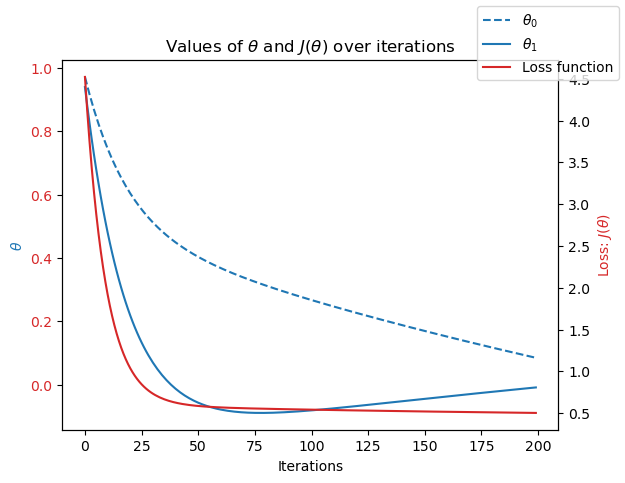

In [543]:
fig, ax1 = plt.subplots()

# plot thetas over time
color='tab:blue'
ax1.plot(theta0_history, label='$\\theta_{0}$', linestyle='--', color=color)
ax1.plot(theta1_history, label='$\\theta_{1}$', linestyle='-', color=color)
# ax1.legend()
ax1.set_xlabel('Iterations'); ax1.set_ylabel('$\\theta$', color=color);
ax1.tick_params(axis='y', labelcolor=color)

# plot loss function over time
color='tab:red'
ax2 = ax1.twinx()
ax2.plot(J_history, label='Loss function', color=color)
ax2.set_title('Values of $\\theta$ and $J(\\theta)$ over iterations')
ax2.set_ylabel('Loss: $J(\\theta)$', color=color)
ax1.tick_params(axis='y', labelcolor=color)

# ax2.legend();
fig.legend();

plt.show()


In [544]:
%%time
# theta range
theta0_vals = np.linspace(-10,10,100) 
theta1_vals = np.linspace(-10,10,100) 
                                     
J_vals = np.zeros((len(theta0_vals), len(theta1_vals)))

# compute cost for each combination of theta
c1=0; c2=0
for i in theta0_vals:
    for j in theta1_vals:
        t = np.array([i, j])
        J_vals[c1][c2] = compute_cost(X, y, t.transpose()).tolist()[0]
        c2=c2+1
    c1=c1+1
    c2=0 # reinitialize to 0


CPU times: total: 4.05 s
Wall time: 4.04 s


In [545]:
#Show loss function.

#X = Theta0
#Y - Theta1
#Z = Loss

#you can click/hold in the graph below to rotate!

fig = go.Figure(data=[go.Surface(x=theta1_vals, y=theta0_vals, z=J_vals)])
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()


In [546]:
#Here is the same figure as above, with the line the loss function takes toward the minimum.

#X = Theta0
#Y - Theta1
#Z = Loss
#black line = path of loss function over the iterations.
#Find where it is closest to 0 in X and Y!

#you can click/hold in the graph below to rotate!

line_marker = dict(color='#101010', width=2)
fig = go.Figure()
fig.add_surface(x=theta1_vals, y=theta0_vals, z=J_vals)
fig.add_scatter3d(x=theta1_history, y=theta0_history, z=J_history, line=line_marker, name='')
#The below line adds a graph of just the loss over iterations in a 2D plane
plt.plot(theta0_history, theta1_history, 'r+');
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()


In [547]:
#Rerun the optimisation above closer to the objective


num_iterations=200
theta_init=np.array([[0],[0]])
alpha= 0.01 
theta1, J_history1, theta0_history1, theta1_history1 = gradient_descent(X,y, theta_init,
                                                                   alpha, num_iterations)


# New loss path on the function

line_marker = dict(color='#101010', width=2)
fig = go.Figure()
fig.add_surface(x=theta1_vals, y=theta0_vals, z=J_vals)
fig.add_scatter3d(x=theta1_history1, y=theta0_history1, z=J_history1, line=line_marker, name='')
#The below line adds a graph of just the loss over iterations in a 2D plane
plt.plot(theta0_history1, theta1_history1, 'r+');
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()


### 2.5 Year 1990

In [549]:
#Reduce your dataset to only year 1990
dfyear1990 = df.loc[df['DATE'].astype(str).str[:4] == '1990'] #<-----INSERT YEAR HERE
dfyear1990

,DATE,MONTH,BASEL_temp_mean,BELGRADE_temp_mean,BUDAPEST_temp_mean,DEBILT_temp_mean,DUSSELDORF_temp_mean,GDANSK_temp_mean,HEATHROW_temp_mean,KASSEL_temp_mean,LJUBLJANA_temp_mean,MAASTRICHT_temp_mean,MADRID_temp_mean,MUNCHENB_temp_mean,OSLO_temp_mean,ROMA_temp_mean,SONNBLICK_temp_mean,STOCKHOLM_temp_mean,TOURS_temp_mean,VALENTIA_temp_mean
10958,19900101,1,-1.696559,-1.584333,-1.369721,-1.506712,-1.490139,-1.298463,-1.172216,-1.541424,-1.479805,-1.447359,-0.974801,-1.811529,-1.594218,-1.937140,-0.460708,-1.274353,-1.528019,-1.148890
10959,19900102,1,-1.655817,-1.538937,-1.428538,-1.427601,-1.269240,-1.081061,-1.049918,-1.452825,-1.528241,-1.342338,-1.136550,-1.522480,-1.497139,-1.566700,-0.782460,-1.448521,-1.292705,-1.028721
10960,19900103,1,-1.710140,-1.527588,-1.440302,-1.301023,-1.460686,-1.196156,-1.259573,-1.570958,-1.382933,-1.387347,-1.069155,-1.359104,-1.703431,-1.600376,-0.972586,-1.361437,-1.261329,-0.878510
10961,19900104,1,-1.506430,-1.788618,-1.616753,-1.538357,-1.401779,-1.515865,-1.032446,-1.570958,-1.516132,-1.642398,-1.136550,-1.710990,-1.023880,-1.583538,-1.001836,-0.938458,-1.386830,-1.269058
10962,19900105,1,-1.411366,-2.083696,-1.687333,-1.063690,-1.107247,-1.592595,-0.805320,-1.408526,-1.794639,-1.237316,-1.082634,-1.447075,-0.878261,-1.886626,-0.870210,-0.963339,-1.135828,-0.397835
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11318,19901227,12,-0.515042,-1.005527,-1.299141,-0.589023,-0.842167,-0.786929,-0.945090,-0.832631,-1.177080,-0.772222,-0.840010,-0.491955,-0.659834,-1.246774,-0.943336,-0.453275,-0.712262,-0.998679
11319,19901228,12,-0.895301,-1.107669,-1.169744,-0.810534,-0.753808,-0.825294,-0.648078,-1.024596,-1.092317,-0.862240,-0.907406,-1.057487,-0.805452,-1.263612,-1.338213,-0.639884,-0.759325,-0.788384
11320,19901229,12,-0.012558,-1.289256,-1.463829,-0.240934,-0.400369,-0.850871,-0.648078,-0.463468,-1.080208,-0.247115,-0.853490,-0.077232,-0.684104,-1.566700,-0.723959,-0.565240,-0.100445,-1.899944
11321,19901230,12,0.218313,-0.937432,-1.263851,-0.604845,-0.503455,-0.659045,-0.857734,-0.611133,-0.801701,-0.532173,-0.893927,-0.240607,-1.145228,-0.960524,-0.007330,-0.602562,-0.382822,-1.779775


In [550]:
#Drop the DATE and MONTH data as those numbers are not scaled with the rest.
notempyear1990 = dfyear1990.drop(['DATE'], axis=1)

In [551]:
#Plot ALL weather data for all stations for a year 

#X = weather station
#Y = day of the year
#Z = temperature

#you can click/hold in the graph below to rotate!

fig = go.Figure(data=[go.Surface(z=notempyear1990.values)])
fig.update_layout(title='Temperatures over time', autosize=False,
                  width=600, height=600)
fig.show()

In [552]:
#We need to make an index for the year. Create a set of data from 1 to 365 (or to 366 if it's a leap year!)
#We'll scale this by 100 as the index is made. This will help teh gradient descent converge 366 = 3.66

i = np.arange(0.01,3.66,0.01) #<---needs to be one GREATER than the total number of days
index = pd.DataFrame(data = i, columns = ['index'])
index

,index
0,0.01
1,0.02
2,0.03
3,0.04
4,0.05
...,...
360,3.61
361,3.62
362,3.63
363,3.64


In [553]:
n_rows = dfyear1990.shape[0]
n_rows

365

### 2.6 Heahtrow, 1990

In [563]:
#This will translate your chosen weather data into the X and y datasets needed for the optimization function.

X=index.to_numpy().reshape(n_rows,1)
#Represent x_0 as a vector of 1s for vector computation
ones = np.ones((n_rows,1))
X = np.concatenate((ones, X), axis=1)
y=dfyear1990['HEATHROW_temp_mean'].to_numpy().reshape(n_rows,1)


In [565]:

X.shape, y.shape


((365, 2), (365, 1))

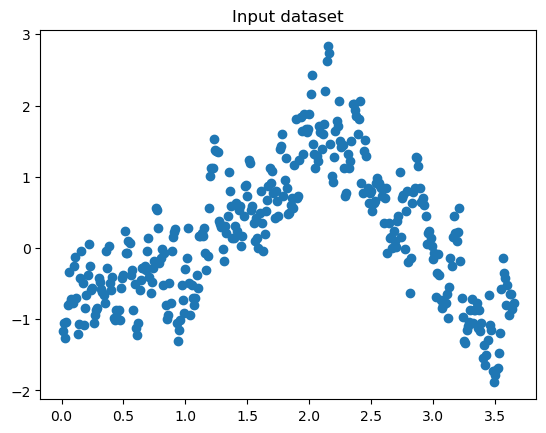

In [569]:
#Look at one year of temperature data over time
plt.scatter(x=index['index'], y=dfyear1990['HEATHROW_temp_mean'])
plt.title('Input dataset');
plt.show()

In [573]:
# Find min temperature
dfyear1990['HEATHROW_temp_mean'].min()

-1.8885385379001367

In [575]:
# Find max temperature
dfyear1990['HEATHROW_temp_mean'].max()

2.8287045323970625

In [577]:
# Compute loss function for the gradiant descent

def compute_cost(X, y, theta=np.array([[0],[0]])):
    """Given covariate matrix X, the prediction results y and coefficients theta
    compute the loss"""
    
    m = len(y)
    J=0 # initialize loss to zero
    
    # reshape theta
    theta=theta.reshape(2,1)
    
    # calculate the hypothesis - y_hat
    h_x = np.dot(X,theta)
    #print(h_x)
    
    # subtract y from y_hat, square and sum
    error_term = sum((h_x - y)**2)
    
    # divide by twice the number of samples - standard practice.
    loss = error_term/(2*m)
    
    return loss


In [579]:
compute_cost(X,y)

array([0.45418923])

In [581]:
# Gradient descent function

def gradient_descent(X, y, theta=np.array([[0],[0]]),
                    alpha=0.01, num_iterations=1500):
    """
    Solve for theta using Gradient Descent optimiztion technique. 
    Alpha is the learning rate
    """
    m = len(y)
    J_history = []
    theta0_history = []
    theta1_history = []
    theta = theta.reshape(2,1)
    
    for i in range(num_iterations):
        error = (np.dot(X, theta) - y)
        
        term0 = (alpha/m) * sum(error* X[:,0].reshape(m,1))
        term1 = (alpha/m) * sum(error* X[:,1].reshape(m,1))
        
        # update theta
        term_vector = np.array([[term0],[term1]])
        #print(term_vector)
        theta = theta - term_vector.reshape(2,1)
        
        # store history values
        theta0_history.append(theta[0].tolist()[0])
        theta1_history.append(theta[1].tolist()[0])
        J_history.append(compute_cost(X,y,theta).tolist()[0])
        
    return (theta, J_history, theta0_history, theta1_history)


In [583]:
%%time
#This runs the data through a gradiant descent for the starting conditions in 'theta_init.'

num_iterations= 500 
theta_init=np.array([[0],[0]]) 
alpha=0.01 
theta, J_history, theta0_history, theta1_history = gradient_descent(X,y, theta_init,
                                                                   alpha, num_iterations)


CPU times: total: 438 ms
Wall time: 511 ms


In [585]:

theta


array([[0.00366594],
       [0.08311905]])

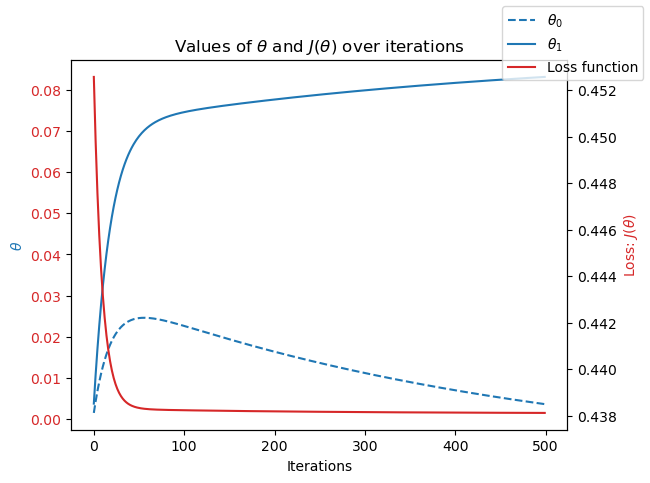

In [587]:
fig, ax1 = plt.subplots()

# plot thetas over time
color='tab:blue'
ax1.plot(theta0_history, label='$\\theta_{0}$', linestyle='--', color=color)
ax1.plot(theta1_history, label='$\\theta_{1}$', linestyle='-', color=color)
# ax1.legend()
ax1.set_xlabel('Iterations'); ax1.set_ylabel('$\\theta$', color=color);
ax1.tick_params(axis='y', labelcolor=color)

# plot loss function over time
color='tab:red'
ax2 = ax1.twinx()
ax2.plot(J_history, label='Loss function', color=color)
ax2.set_title('Values of $\\theta$ and $J(\\theta)$ over iterations')
ax2.set_ylabel('Loss: $J(\\theta)$', color=color)
ax1.tick_params(axis='y', labelcolor=color)

# ax2.legend();
fig.legend();

plt.show()

In [589]:
%%time
# theta range
theta0_vals = np.linspace(-10,10,100) 
theta1_vals = np.linspace(-10,10,100) 
                                     
J_vals = np.zeros((len(theta0_vals), len(theta1_vals)))

# compute cost for each combination of theta
c1=0; c2=0
for i in theta0_vals:
    for j in theta1_vals:
        t = np.array([i, j])
        J_vals[c1][c2] = compute_cost(X, y, t.transpose()).tolist()[0]
        c2=c2+1
    c1=c1+1
    c2=0 # reinitialize to 0


CPU times: total: 3.55 s
Wall time: 4.08 s


In [591]:
#Show loss function.

#X = Theta0
#Y - Theta1
#Z = Loss

#you can click/hold in the graph below to rotate!

fig = go.Figure(data=[go.Surface(x=theta1_vals, y=theta0_vals, z=J_vals)])
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()


In [593]:
#Here is the same figure as above, with the line the loss function takes toward the minimum.

#X = Theta0
#Y - Theta1
#Z = Loss
#black line = path of loss function over the iterations.
#Find where it is closest to 0 in X and Y!

#you can click/hold in the graph below to rotate!

line_marker = dict(color='#101010', width=2)
fig = go.Figure()
fig.add_surface(x=theta1_vals, y=theta0_vals, z=J_vals)
fig.add_scatter3d(x=theta1_history, y=theta0_history, z=J_history, line=line_marker, name='')
#The below line adds a graph of just the loss over iterations in a 2D plane
plt.plot(theta0_history, theta1_history, 'r+');
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()


In [595]:
#Rerun the optimisation above closer to the objective


num_iterations=500
theta_init=np.array([[-0.12],[0.26]])
alpha= 0.01 
theta1, J_history1, theta0_history1, theta1_history1 = gradient_descent(X,y, theta_init,
                                                                   alpha, num_iterations)


In [597]:
# New loss path on the function

line_marker = dict(color='#101010', width=2)
fig = go.Figure()
fig.add_surface(x=theta1_vals, y=theta0_vals, z=J_vals)
fig.add_scatter3d(x=theta1_history1, y=theta0_history1, z=J_history1, line=line_marker, name='')
#The below line adds a graph of just the loss over iterations in a 2D plane
plt.plot(theta0_history1, theta1_history1, 'r+');
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

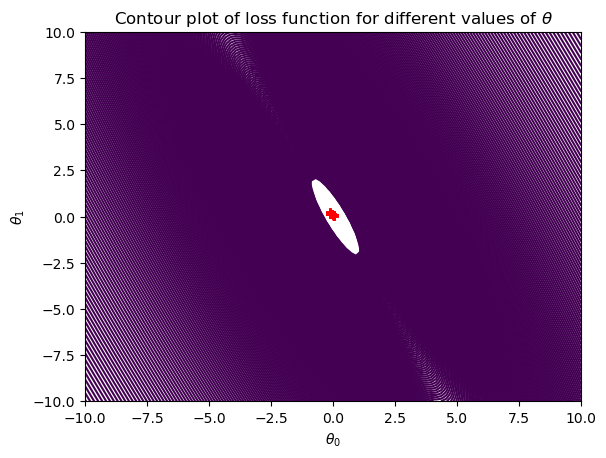

In [599]:
T0, T1 = np.meshgrid(theta0_vals, theta1_vals)  # Create 2D grid

plt.contour(T0, T1, J_vals, levels=np.logspace(0, 10, 1000))
plt.xlabel(r'$\theta_{0}$')
plt.ylabel(r'$\theta_{1}$')
plt.title("Contour plot of loss function for different values of $\\theta$")
plt.plot(theta0_history1, theta1_history1, 'r+')
plt.show()

### 2.7 Rome, 1990

In [602]:
#This will translate your chosen weather data into the X and y datasets needed for the optimization function.

X=index.to_numpy().reshape(n_rows,1)
#Represent x_0 as a vector of 1s for vector computation
ones = np.ones((n_rows,1))
X = np.concatenate((ones, X), axis=1)
y=dfyear1990['ROMA_temp_mean'].to_numpy().reshape(n_rows,1)


X.shape, y.shape

((365, 2), (365, 1))

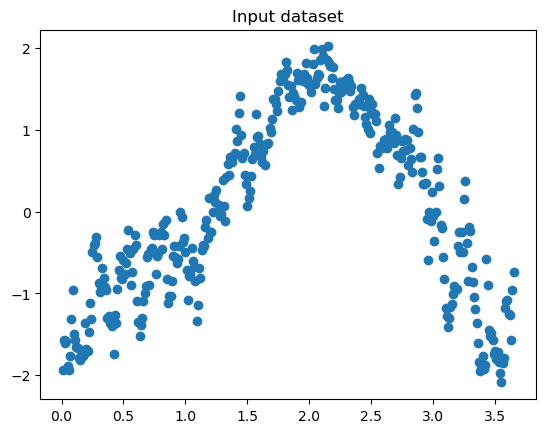

In [604]:
#Look at one year of temperature data over time
plt.scatter(x=index['index'], y=dfyear1990['ROMA_temp_mean'])
plt.title('Input dataset');
plt.show()

In [606]:
# Find min temperature
dfyear1990['ROMA_temp_mean'].min()

-2.0886841879872984

In [608]:
# Find max temperature
dfyear1990['ROMA_temp_mean'].max()

2.019839020877644

In [610]:
# Compute loss function for the gradiant descent

def compute_cost(X, y, theta=np.array([[0],[0]])):
    """Given covariate matrix X, the prediction results y and coefficients theta
    compute the loss"""
    
    m = len(y)
    J=0 # initialize loss to zero
    
    # reshape theta
    theta=theta.reshape(2,1)
    
    # calculate the hypothesis - y_hat
    h_x = np.dot(X,theta)
    #print(h_x)
    
    # subtract y from y_hat, square and sum
    error_term = sum((h_x - y)**2)
    
    # divide by twice the number of samples - standard practice.
    loss = error_term/(2*m)
    
    return loss


compute_cost(X,y)

array([0.63833699])

In [612]:
# Gradient descent function

def gradient_descent(X, y, theta=np.array([[0],[0]]),
                    alpha=0.01, num_iterations=1500):
    """
    Solve for theta using Gradient Descent optimiztion technique. 
    Alpha is the learning rate
    """
    m = len(y)
    J_history = []
    theta0_history = []
    theta1_history = []
    theta = theta.reshape(2,1)
    
    for i in range(num_iterations):
        error = (np.dot(X, theta) - y)
        
        term0 = (alpha/m) * sum(error* X[:,0].reshape(m,1))
        term1 = (alpha/m) * sum(error* X[:,1].reshape(m,1))
        
        # update theta
        term_vector = np.array([[term0],[term1]])
        #print(term_vector)
        theta = theta - term_vector.reshape(2,1)
        
        # store history values
        theta0_history.append(theta[0].tolist()[0])
        theta1_history.append(theta[1].tolist()[0])
        J_history.append(compute_cost(X,y,theta).tolist()[0])
        
    return (theta, J_history, theta0_history, theta1_history)

In [614]:
%%time
#This runs the data through a gradiant descent for the starting conditions in 'theta_init.'

num_iterations= 300 
theta_init=np.array([[0],[0]]) 
alpha=0.05
theta, J_history, theta0_history, theta1_history = gradient_descent(X,y, theta_init,
                                                                   alpha, num_iterations)


theta

CPU times: total: 344 ms
Wall time: 421 ms


array([[-0.36621335],
       [ 0.22322281]])

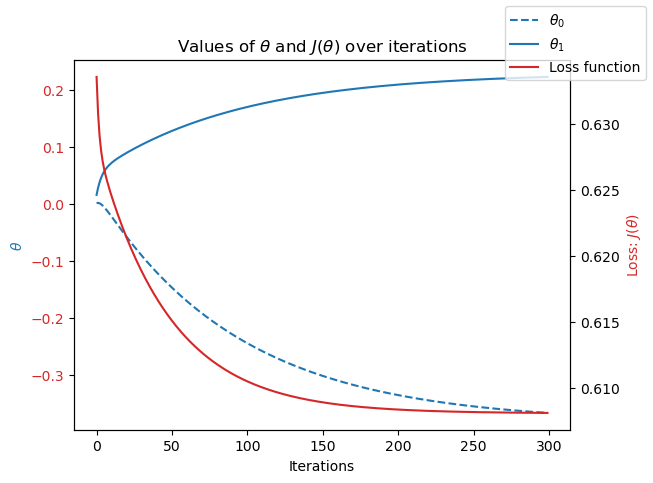

In [616]:
fig, ax1 = plt.subplots()

# plot thetas over time
color='tab:blue'
ax1.plot(theta0_history, label='$\\theta_{0}$', linestyle='--', color=color)
ax1.plot(theta1_history, label='$\\theta_{1}$', linestyle='-', color=color)
# ax1.legend()
ax1.set_xlabel('Iterations'); ax1.set_ylabel('$\\theta$', color=color);
ax1.tick_params(axis='y', labelcolor=color)

# plot loss function over time
color='tab:red'
ax2 = ax1.twinx()
ax2.plot(J_history, label='Loss function', color=color)
ax2.set_title('Values of $\\theta$ and $J(\\theta)$ over iterations')
ax2.set_ylabel('Loss: $J(\\theta)$', color=color)
ax1.tick_params(axis='y', labelcolor=color)

# ax2.legend();
fig.legend();

plt.show()


In [618]:
%%time
# theta range
theta0_vals = np.linspace(-10,10,100) 
theta1_vals = np.linspace(-10,10,100) 
                                     
J_vals = np.zeros((len(theta0_vals), len(theta1_vals)))

# compute cost for each combination of theta
c1=0; c2=0
for i in theta0_vals:
    for j in theta1_vals:
        t = np.array([i, j])
        J_vals[c1][c2] = compute_cost(X, y, t.transpose()).tolist()[0]
        c2=c2+1
    c1=c1+1
    c2=0 # reinitialize to 0

CPU times: total: 3.39 s
Wall time: 3.65 s


In [620]:
#Show loss function.

#X = Theta0
#Y - Theta1
#Z = Loss

#you can click/hold in the graph below to rotate!

fig = go.Figure(data=[go.Surface(x=theta1_vals, y=theta0_vals, z=J_vals)])
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

In [622]:
#Here is the same figure as above, with the line the loss function takes toward the minimum.

#X = Theta0
#Y - Theta1
#Z = Loss
#black line = path of loss function over the iterations.
#Find where it is closest to 0 in X and Y!

#you can click/hold in the graph below to rotate!

line_marker = dict(color='#101010', width=2)
fig = go.Figure()
fig.add_surface(x=theta1_vals, y=theta0_vals, z=J_vals)
fig.add_scatter3d(x=theta1_history, y=theta0_history, z=J_history, line=line_marker, name='')
#The below line adds a graph of just the loss over iterations in a 2D plane
plt.plot(theta0_history, theta1_history, 'r+');
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()


In [624]:
#Rerun the optimisation above closer to the objective


num_iterations=300
theta_init=np.array([[-0.12],[0.26]])
alpha= 0.05
theta1, J_history1, theta0_history1, theta1_history1 = gradient_descent(X,y, theta_init,
                                                                   alpha, num_iterations)


In [626]:
# New loss path on the function

line_marker = dict(color='#101010', width=2)
fig = go.Figure()
fig.add_surface(x=theta1_vals, y=theta0_vals, z=J_vals)
fig.add_scatter3d(x=theta1_history1, y=theta0_history1, z=J_history1, line=line_marker, name='')
#The below line adds a graph of just the loss over iterations in a 2D plane
plt.plot(theta0_history1, theta1_history1, 'r+');
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

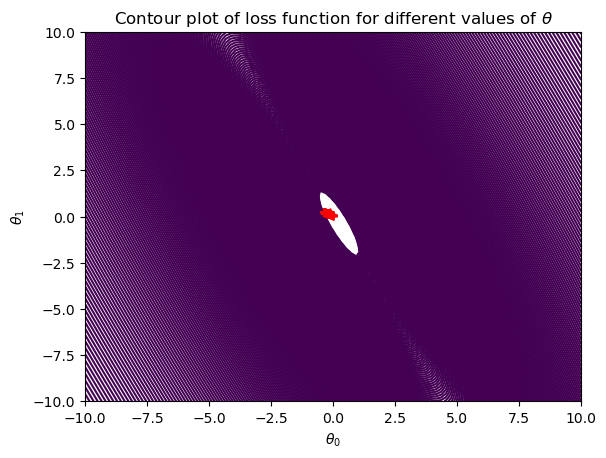

In [628]:
T0, T1 = np.meshgrid(theta0_vals, theta1_vals)  # Create 2D grid

plt.contour(T0, T1, J_vals, levels=np.logspace(0, 10, 1000))
plt.xlabel(r'$\theta_{0}$')
plt.ylabel(r'$\theta_{1}$')
plt.title("Contour plot of loss function for different values of $\\theta$")
plt.plot(theta0_history1, theta1_history1, 'r+')
plt.show()

### 2.8 Stockholm, 1990

In [631]:
#This will translate your chosen weather data into the X and y datasets needed for the optimization function.

X=index.to_numpy().reshape(n_rows,1)
#Represent x_0 as a vector of 1s for vector computation
ones = np.ones((n_rows,1))
X = np.concatenate((ones, X), axis=1)
y=dfyear1990['STOCKHOLM_temp_mean'].to_numpy().reshape(n_rows,1)


X.shape, y.shape

((365, 2), (365, 1))

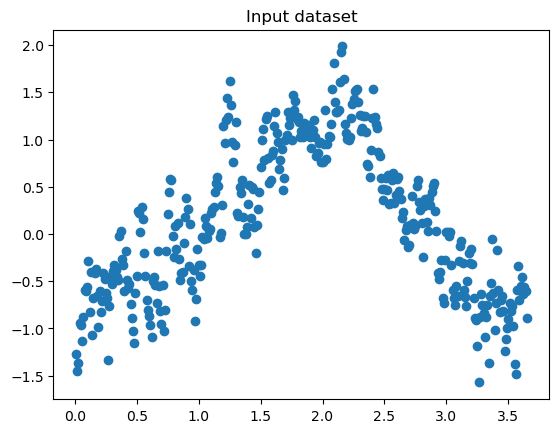

In [633]:
#Look at one year of temperature data over time
plt.scatter(x=index['index'], y=dfyear1990['STOCKHOLM_temp_mean'])
plt.title('Input dataset');
plt.show()


In [637]:
# Find min temperature
dfyear1990['STOCKHOLM_temp_mean'].min()

-1.5729271315157165

In [639]:
# Find max temperature
dfyear1990['STOCKHOLM_temp_mean'].max()

1.9850783511997607

In [641]:
# Compute loss function for the gradiant descent

def compute_cost(X, y, theta=np.array([[0],[0]])):
    """Given covariate matrix X, the prediction results y and coefficients theta
    compute the loss"""
    
    m = len(y)
    J=0 # initialize loss to zero
    
    # reshape theta
    theta=theta.reshape(2,1)
    
    # calculate the hypothesis - y_hat
    h_x = np.dot(X,theta)
    #print(h_x)
    
    # subtract y from y_hat, square and sum
    error_term = sum((h_x - y)**2)
    
    # divide by twice the number of samples - standard practice.
    loss = error_term/(2*m)
    
    return loss

In [643]:
compute_cost(X,y)

array([0.3193237])

In [645]:
# Gradient descent function

def gradient_descent(X, y, theta=np.array([[0],[0]]),
                    alpha=0.01, num_iterations=1500):
    """
    Solve for theta using Gradient Descent optimiztion technique. 
    Alpha is the learning rate
    """
    m = len(y)
    J_history = []
    theta0_history = []
    theta1_history = []
    theta = theta.reshape(2,1)
    
    for i in range(num_iterations):
        error = (np.dot(X, theta) - y)
        
        term0 = (alpha/m) * sum(error* X[:,0].reshape(m,1))
        term1 = (alpha/m) * sum(error* X[:,1].reshape(m,1))
        
        # update theta
        term_vector = np.array([[term0],[term1]])
        #print(term_vector)
        theta = theta - term_vector.reshape(2,1)
        
        # store history values
        theta0_history.append(theta[0].tolist()[0])
        theta1_history.append(theta[1].tolist()[0])
        J_history.append(compute_cost(X,y,theta).tolist()[0])
        
    return (theta, J_history, theta0_history, theta1_history)

In [647]:
%%time
#This runs the data through a gradiant descent for the starting conditions in 'theta_init.'

num_iterations= 100 
theta_init=np.array([[0],[0]]) 
alpha=0.1
theta, J_history, theta0_history, theta1_history = gradient_descent(X,y, theta_init,
                                                                   alpha, num_iterations)


theta

CPU times: total: 109 ms
Wall time: 114 ms


array([[0.05212413],
       [0.04299313]])

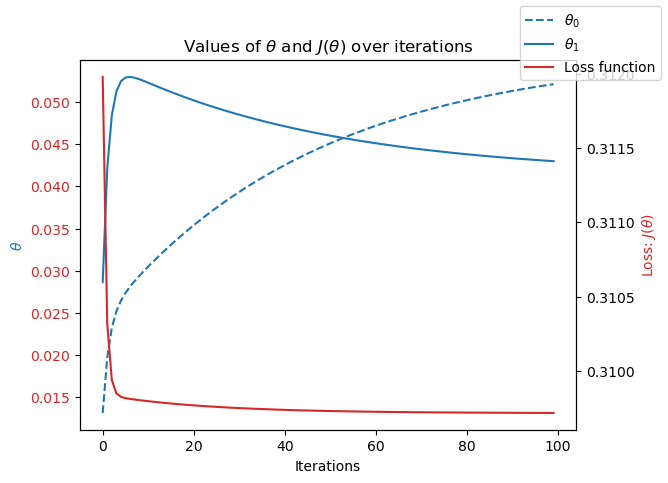

In [649]:
fig, ax1 = plt.subplots()

# plot thetas over time
color='tab:blue'
ax1.plot(theta0_history, label='$\\theta_{0}$', linestyle='--', color=color)
ax1.plot(theta1_history, label='$\\theta_{1}$', linestyle='-', color=color)
# ax1.legend()
ax1.set_xlabel('Iterations'); ax1.set_ylabel('$\\theta$', color=color);
ax1.tick_params(axis='y', labelcolor=color)

# plot loss function over time
color='tab:red'
ax2 = ax1.twinx()
ax2.plot(J_history, label='Loss function', color=color)
ax2.set_title('Values of $\\theta$ and $J(\\theta)$ over iterations')
ax2.set_ylabel('Loss: $J(\\theta)$', color=color)
ax1.tick_params(axis='y', labelcolor=color)

# ax2.legend();
fig.legend();

plt.show()

In [651]:
%%time
# theta range
theta0_vals = np.linspace(-10,10,100) 
theta1_vals = np.linspace(-10,10,100) 
                                     
J_vals = np.zeros((len(theta0_vals), len(theta1_vals)))

# compute cost for each combination of theta
c1=0; c2=0
for i in theta0_vals:
    for j in theta1_vals:
        t = np.array([i, j])
        J_vals[c1][c2] = compute_cost(X, y, t.transpose()).tolist()[0]
        c2=c2+1
    c1=c1+1
    c2=0 # reinitialize to 0

CPU times: total: 3.42 s
Wall time: 3.77 s


In [653]:
#Show loss function.

#X = Theta0
#Y - Theta1
#Z = Loss

#you can click/hold in the graph below to rotate!

fig = go.Figure(data=[go.Surface(x=theta1_vals, y=theta0_vals, z=J_vals)])
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()


In [655]:
#Here is the same figure as above, with the line the loss function takes toward the minimum.

#X = Theta0
#Y - Theta1
#Z = Loss
#black line = path of loss function over the iterations.
#Find where it is closest to 0 in X and Y!

#you can click/hold in the graph below to rotate!

line_marker = dict(color='#101010', width=2)
fig = go.Figure()
fig.add_surface(x=theta1_vals, y=theta0_vals, z=J_vals)
fig.add_scatter3d(x=theta1_history, y=theta0_history, z=J_history, line=line_marker, name='')
#The below line adds a graph of just the loss over iterations in a 2D plane
plt.plot(theta0_history, theta1_history, 'r+');
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

In [657]:
#Rerun the optimisation above closer to the objective


num_iterations=100
theta_init=np.array([[-0.12],[0.26]])
alpha= 0.1
theta1, J_history1, theta0_history1, theta1_history1 = gradient_descent(X,y, theta_init,
                                                                   alpha, num_iterations)


In [659]:
# New loss path on the function

line_marker = dict(color='#101010', width=2)
fig = go.Figure()
fig.add_surface(x=theta1_vals, y=theta0_vals, z=J_vals)
fig.add_scatter3d(x=theta1_history1, y=theta0_history1, z=J_history1, line=line_marker, name='')
#The below line adds a graph of just the loss over iterations in a 2D plane
plt.plot(theta0_history1, theta1_history1, 'r+');
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

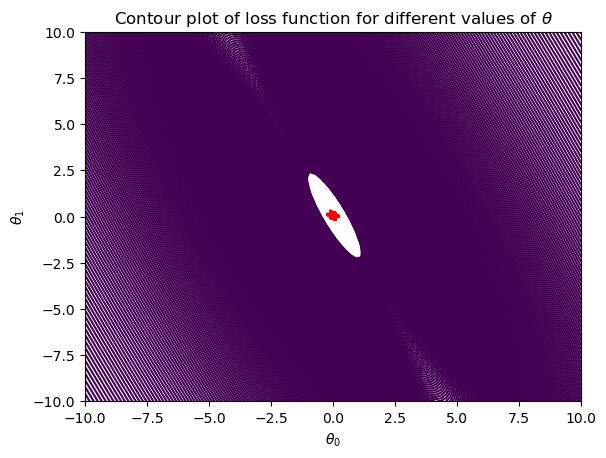

In [661]:
T0, T1 = np.meshgrid(theta0_vals, theta1_vals)  # Create 2D grid

plt.contour(T0, T1, J_vals, levels=np.logspace(0, 10, 1000))
plt.xlabel(r'$\theta_{0}$')
plt.ylabel(r'$\theta_{1}$')
plt.title("Contour plot of loss function for different values of $\\theta$")
plt.plot(theta0_history1, theta1_history1, 'r+')
plt.show()

### 2.9 Year 2020

In [664]:
#Reduce your dataset to only year 2020
dfyear2020 = df.loc[df['DATE'].astype(str).str[:4] == '2020'] #<-----INSERT YEAR HERE
dfyear2020

,DATE,MONTH,BASEL_temp_mean,BELGRADE_temp_mean,BUDAPEST_temp_mean,DEBILT_temp_mean,DUSSELDORF_temp_mean,GDANSK_temp_mean,HEATHROW_temp_mean,KASSEL_temp_mean,LJUBLJANA_temp_mean,MAASTRICHT_temp_mean,MADRID_temp_mean,MUNCHENB_temp_mean,OSLO_temp_mean,ROMA_temp_mean,SONNBLICK_temp_mean,STOCKHOLM_temp_mean,TOURS_temp_mean,VALENTIA_temp_mean
21915,20200101,1,-1.465688,-1.209812,-0.934476,-1.459245,-1.387053,-0.735776,-1.102331,-0.005705,-1.370824,-1.612392,-1.123071,-1.032352,-0.550620,-0.000746,-0.153581,-0.478156,-0.869139,-0.007287
21916,20200102,1,-1.397785,-1.141717,-1.169744,-0.968756,-1.225060,-0.953178,-0.595665,-0.005705,-1.625113,-0.997267,-1.203946,-1.321402,-0.283654,-0.000746,-0.051205,-0.192023,-0.414197,-0.007287
21917,20200103,1,-0.691591,-1.357351,-1.569699,-0.383334,-0.444548,-0.799717,-0.386009,-0.005705,-1.419260,-0.397145,-1.500486,-0.693033,-0.235114,-0.000746,0.007295,-0.241785,-0.288696,-0.007287
21918,20200104,1,-0.596526,-1.504889,-1.063873,-0.525734,-0.827441,-0.556739,-0.980032,-0.005705,-1.104426,-0.772222,-1.069155,-0.592494,-0.696239,-0.000746,-0.694709,-0.615003,-0.978952,-0.007287
21919,20200105,1,-1.180494,-1.050924,-1.040346,-0.494089,-0.635995,-0.722987,-0.648078,-0.005705,-1.225516,-0.637194,-1.176988,-0.818707,-0.793317,-0.000746,-1.382089,-0.901136,-0.822076,-0.007287
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22276,20201227,12,-1.180494,-1.130368,-1.369721,-0.794712,-0.871621,-1.017119,-0.875205,-0.005705,-1.382933,-0.877243,-1.635277,-1.396806,-0.429272,-0.000746,-1.148087,-0.391072,-0.947577,-0.007287
22277,20201228,12,-0.786655,-0.528863,-0.863895,-1.016223,-0.945254,-0.710199,-1.783711,-0.005705,-1.261843,-1.087286,-1.244383,-1.095189,-0.623429,-0.000746,-1.177337,-0.391072,-1.135828,-0.007287
22278,20201229,12,-0.813817,-0.131643,-0.346305,-1.000401,-1.357599,-0.480009,-1.539113,-0.005705,-0.947009,-1.207310,-1.406132,-0.781005,-0.502081,-0.000746,-1.235838,-0.366191,-1.041702,-0.007287
22279,20201230,12,-1.058269,-0.052199,-0.499230,-0.921290,-1.048340,-0.838082,-1.521642,-0.005705,-0.934900,-1.012270,-1.365695,-0.856409,-0.574890,-0.000746,-1.279713,-0.565240,-1.120141,-0.007287


In [666]:
#Drop the DATE and MONTH data as those numbers are not scaled with the rest.
notempyear2020 = dfyear2020.drop(['DATE'], axis=1)

In [668]:
#Plot ALL weather data for all stations for a year 

#X = weather station
#Y = day of the year
#Z = temperature

#you can click/hold in the graph below to rotate!

fig = go.Figure(data=[go.Surface(z=notempyear2020.values)])
fig.update_layout(title='Temperatures over time', autosize=False,
                  width=600, height=600)
fig.show()


In [670]:
#We need to make an index for the year. Create a set of data from 1 to 365 (or to 366 if it's a leap year!)
#We'll scale this by 100 as the index is made. This will help the gradient descent converge 366 = 3.66

i = np.arange(0.01,3.67,0.01) #<---needs to be one GREATER than the total number of days
index = pd.DataFrame(data = i, columns = ['index'])
index


,index
0,0.01
1,0.02
2,0.03
3,0.04
4,0.05
...,...
361,3.62
362,3.63
363,3.64
364,3.65


In [672]:
n_rows = dfyear2020.shape[0]
n_rows

366

### 2.10 Heathrow, 2020

In [675]:
#This will translate your chosen weather data into the X and y datasets needed for the optimization function.

X=index.to_numpy().reshape(n_rows,1)
#Represent x_0 as a vector of 1s for vector computation
ones = np.ones((n_rows,1))
X = np.concatenate((ones, X), axis=1)
y=dfyear2020['HEATHROW_temp_mean'].to_numpy().reshape(n_rows,1)


X.shape, y.shape

((366, 2), (366, 1))

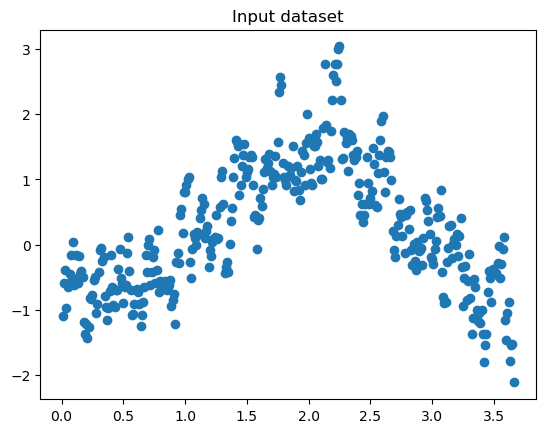

In [677]:
#Look at one year of temperature data over time
plt.scatter(x=index['index'], y=dfyear2020['HEATHROW_temp_mean'])
plt.title('Input dataset');
plt.show()

In [679]:
# Find min temperature
dfyear2020['HEATHROW_temp_mean'].min()

-2.115665056099632

In [681]:
# Find max temperature
dfyear2020['HEATHROW_temp_mean'].max()

3.038359779965828

In [683]:
# Compute loss function for the gradiant descent

def compute_cost(X, y, theta=np.array([[0],[0]])):
    """Given covariate matrix X, the prediction results y and coefficients theta
    compute the loss"""
    
    m = len(y)
    J=0 # initialize loss to zero
    
    # reshape theta
    theta=theta.reshape(2,1)
    
    # calculate the hypothesis - y_hat
    h_x = np.dot(X,theta)
    #print(h_x)
    
    # subtract y from y_hat, square and sum
    error_term = sum((h_x - y)**2)
    
    # divide by twice the number of samples - standard practice.
    loss = error_term/(2*m)
    
    return loss

In [685]:
compute_cost(X,y)

array([0.50244867])

In [687]:
# Gradient descent function

def gradient_descent(X, y, theta=np.array([[0],[0]]),
                    alpha=0.01, num_iterations=1500):
    """
    Solve for theta using Gradient Descent optimiztion technique. 
    Alpha is the learning rate
    """
    m = len(y)
    J_history = []
    theta0_history = []
    theta1_history = []
    theta = theta.reshape(2,1)
    
    for i in range(num_iterations):
        error = (np.dot(X, theta) - y)
        
        term0 = (alpha/m) * sum(error* X[:,0].reshape(m,1))
        term1 = (alpha/m) * sum(error* X[:,1].reshape(m,1))
        
        # update theta
        term_vector = np.array([[term0],[term1]])
        #print(term_vector)
        theta = theta - term_vector.reshape(2,1)
        
        # store history values
        theta0_history.append(theta[0].tolist()[0])
        theta1_history.append(theta[1].tolist()[0])
        J_history.append(compute_cost(X,y,theta).tolist()[0])
        
    return (theta, J_history, theta0_history, theta1_history)

In [689]:
%%time
#This runs the data through a gradiant descent for the starting conditions in 'theta_init.'

num_iterations= 500 
theta_init=np.array([[0],[0]]) 
alpha=0.02
theta, J_history, theta0_history, theta1_history = gradient_descent(X,y, theta_init,
                                                                   alpha, num_iterations)


theta

CPU times: total: 500 ms
Wall time: 554 ms


array([[0.012684  ],
       [0.12530618]])

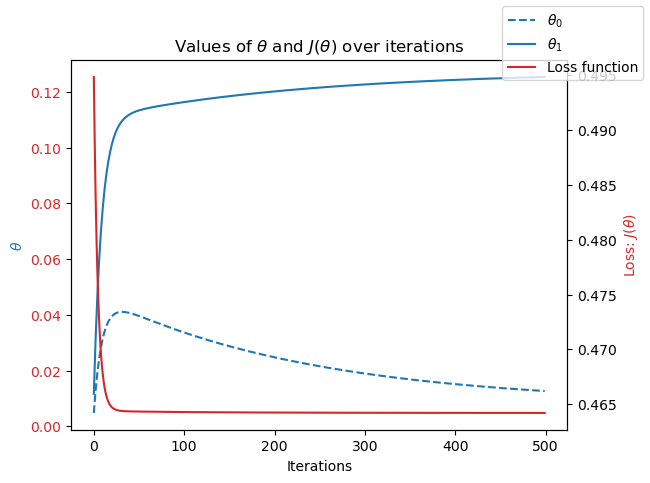

In [691]:
fig, ax1 = plt.subplots()

# plot thetas over time
color='tab:blue'
ax1.plot(theta0_history, label='$\\theta_{0}$', linestyle='--', color=color)
ax1.plot(theta1_history, label='$\\theta_{1}$', linestyle='-', color=color)
# ax1.legend()
ax1.set_xlabel('Iterations'); ax1.set_ylabel('$\\theta$', color=color);
ax1.tick_params(axis='y', labelcolor=color)

# plot loss function over time
color='tab:red'
ax2 = ax1.twinx()
ax2.plot(J_history, label='Loss function', color=color)
ax2.set_title('Values of $\\theta$ and $J(\\theta)$ over iterations')
ax2.set_ylabel('Loss: $J(\\theta)$', color=color)
ax1.tick_params(axis='y', labelcolor=color)

# ax2.legend();
fig.legend();

plt.show()

In [693]:
%%time
# theta range
theta0_vals = np.linspace(-10,10,100) 
theta1_vals = np.linspace(-10,10,100) 
                                     
J_vals = np.zeros((len(theta0_vals), len(theta1_vals)))

# compute cost for each combination of theta
c1=0; c2=0
for i in theta0_vals:
    for j in theta1_vals:
        t = np.array([i, j])
        J_vals[c1][c2] = compute_cost(X, y, t.transpose()).tolist()[0]
        c2=c2+1
    c1=c1+1
    c2=0 # reinitialize to 0

CPU times: total: 4.05 s
Wall time: 4.26 s


In [695]:
#Show loss function.

#X = Theta0
#Y - Theta1
#Z = Loss

#you can click/hold in the graph below to rotate!

fig = go.Figure(data=[go.Surface(x=theta1_vals, y=theta0_vals, z=J_vals)])
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()


In [697]:
#Here is the same figure as above, with the line the loss function takes toward the minimum.

#X = Theta0
#Y - Theta1
#Z = Loss
#black line = path of loss function over the iterations.
#Find where it is closest to 0 in X and Y!

#you can click/hold in the graph below to rotate!

line_marker = dict(color='#101010', width=2)
fig = go.Figure()
fig.add_surface(x=theta1_vals, y=theta0_vals, z=J_vals)
fig.add_scatter3d(x=theta1_history, y=theta0_history, z=J_history, line=line_marker, name='')
#The below line adds a graph of just the loss over iterations in a 2D plane
plt.plot(theta0_history, theta1_history, 'r+');
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

In [699]:
#Rerun the optimisation above closer to the objective


num_iterations=500
theta_init=np.array([[-0.12],[0.26]])
alpha= 0.02 
theta1, J_history1, theta0_history1, theta1_history1 = gradient_descent(X,y, theta_init,
                                                                   alpha, num_iterations)


In [701]:
# New loss path on the function

line_marker = dict(color='#101010', width=2)
fig = go.Figure()
fig.add_surface(x=theta1_vals, y=theta0_vals, z=J_vals)
fig.add_scatter3d(x=theta1_history1, y=theta0_history1, z=J_history1, line=line_marker, name='')
#The below line adds a graph of just the loss over iterations in a 2D plane
plt.plot(theta0_history1, theta1_history1, 'r+');
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

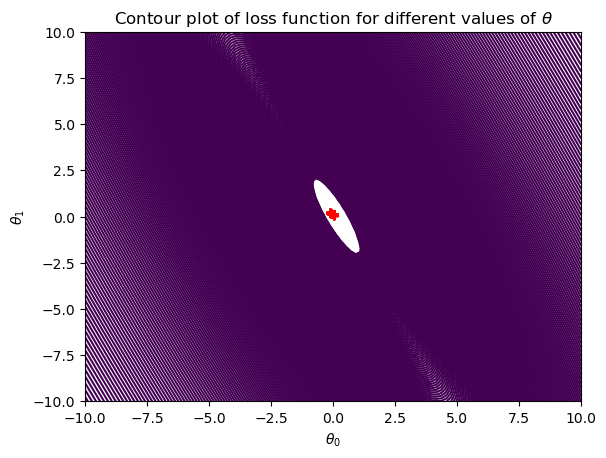

In [703]:
T0, T1 = np.meshgrid(theta0_vals, theta1_vals)  # Create 2D grid

plt.contour(T0, T1, J_vals, levels=np.logspace(0, 10, 1000))
plt.xlabel(r'$\theta_{0}$')
plt.ylabel(r'$\theta_{1}$')
plt.title("Contour plot of loss function for different values of $\\theta$")
plt.plot(theta0_history1, theta1_history1, 'r+')
plt.show()

### 2.11 Rome, 2020

In [706]:
#This will translate your chosen weather data into the X and y datasets needed for the optimization function.

X=index.to_numpy().reshape(n_rows,1)
#Represent x_0 as a vector of 1s for vector computation
ones = np.ones((n_rows,1))
X = np.concatenate((ones, X), axis=1)
y=dfyear2020['ROMA_temp_mean'].to_numpy().reshape(n_rows,1)


X.shape, y.shape


((366, 2), (366, 1))

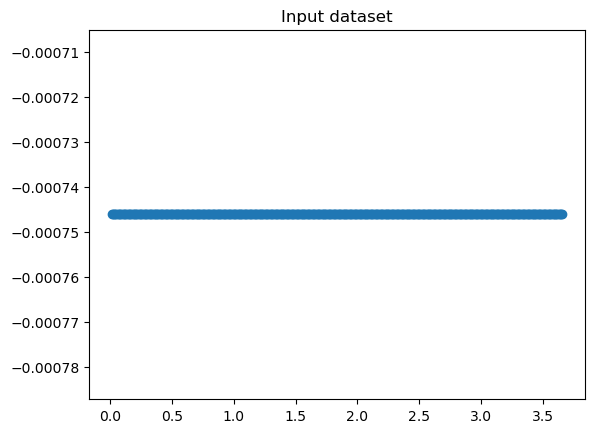

In [710]:
#Look at one year of temperature data over time
plt.scatter(x=index['index'], y=dfyear2020['ROMA_temp_mean'])
plt.title('Input dataset');
plt.show()

In [712]:
# Find min temperature
dfyear2020['ROMA_temp_mean'].min()

-0.0007461638100323

In [714]:
# Find max temperature
dfyear2020['ROMA_temp_mean'].max()

-0.0007461638100323

In [716]:
# Compute loss function for the gradiant descent

def compute_cost(X, y, theta=np.array([[0],[0]])):
    """Given covariate matrix X, the prediction results y and coefficients theta
    compute the loss"""
    
    m = len(y)
    J=0 # initialize loss to zero
    
    # reshape theta
    theta=theta.reshape(2,1)
    
    # calculate the hypothesis - y_hat
    h_x = np.dot(X,theta)
    #print(h_x)
    
    # subtract y from y_hat, square and sum
    error_term = sum((h_x - y)**2)
    
    # divide by twice the number of samples - standard practice.
    loss = error_term/(2*m)
    
    return loss


In [718]:
compute_cost(X,y)

array([2.78380216e-07])

In [720]:
# Gradient descent function

def gradient_descent(X, y, theta=np.array([[0],[0]]),
                    alpha=0.01, num_iterations=1500):
    """
    Solve for theta using Gradient Descent optimiztion technique. 
    Alpha is the learning rate
    """
    m = len(y)
    J_history = []
    theta0_history = []
    theta1_history = []
    theta = theta.reshape(2,1)
    
    for i in range(num_iterations):
        error = (np.dot(X, theta) - y)
        
        term0 = (alpha/m) * sum(error* X[:,0].reshape(m,1))
        term1 = (alpha/m) * sum(error* X[:,1].reshape(m,1))
        
        # update theta
        term_vector = np.array([[term0],[term1]])
        #print(term_vector)
        theta = theta - term_vector.reshape(2,1)
        
        # store history values
        theta0_history.append(theta[0].tolist()[0])
        theta1_history.append(theta[1].tolist()[0])
        J_history.append(compute_cost(X,y,theta).tolist()[0])
        
    return (theta, J_history, theta0_history, theta1_history)

In [722]:
%%time
#This runs the data through a gradiant descent for the starting conditions in 'theta_init.'

num_iterations= 300
theta_init=np.array([[0],[0]]) 
alpha=0.04 
theta, J_history, theta0_history, theta1_history = gradient_descent(X,y, theta_init,
                                                                   alpha, num_iterations)


theta


CPU times: total: 359 ms
Wall time: 382 ms


array([[-6.97067092e-04],
       [-2.10902104e-05]])

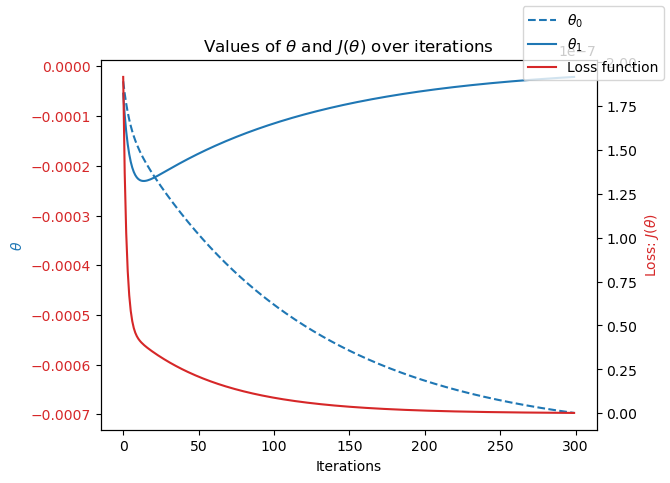

In [724]:
fig, ax1 = plt.subplots()

# plot thetas over time
color='tab:blue'
ax1.plot(theta0_history, label='$\\theta_{0}$', linestyle='--', color=color)
ax1.plot(theta1_history, label='$\\theta_{1}$', linestyle='-', color=color)
# ax1.legend()
ax1.set_xlabel('Iterations'); ax1.set_ylabel('$\\theta$', color=color);
ax1.tick_params(axis='y', labelcolor=color)

# plot loss function over time
color='tab:red'
ax2 = ax1.twinx()
ax2.plot(J_history, label='Loss function', color=color)
ax2.set_title('Values of $\\theta$ and $J(\\theta)$ over iterations')
ax2.set_ylabel('Loss: $J(\\theta)$', color=color)
ax1.tick_params(axis='y', labelcolor=color)

# ax2.legend();
fig.legend();

plt.show()

In [726]:
%%time
# theta range
theta0_vals = np.linspace(-10,10,100) 
theta1_vals = np.linspace(-10,10,100) 
                                     
J_vals = np.zeros((len(theta0_vals), len(theta1_vals)))

# compute cost for each combination of theta
c1=0; c2=0
for i in theta0_vals:
    for j in theta1_vals:
        t = np.array([i, j])
        J_vals[c1][c2] = compute_cost(X, y, t.transpose()).tolist()[0]
        c2=c2+1
    c1=c1+1
    c2=0 # reinitialize to 0

CPU times: total: 3.52 s
Wall time: 4.01 s


In [728]:
#Show loss function.

#X = Theta0
#Y - Theta1
#Z = Loss

#you can click/hold in the graph below to rotate!

fig = go.Figure(data=[go.Surface(x=theta1_vals, y=theta0_vals, z=J_vals)])
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

In [730]:
#Here is the same figure as above, with the line the loss function takes toward the minimum.

#X = Theta0
#Y - Theta1
#Z = Loss
#black line = path of loss function over the iterations.
#Find where it is closest to 0 in X and Y!

#you can click/hold in the graph below to rotate!

line_marker = dict(color='#101010', width=2)
fig = go.Figure()
fig.add_surface(x=theta1_vals, y=theta0_vals, z=J_vals)
fig.add_scatter3d(x=theta1_history, y=theta0_history, z=J_history, line=line_marker, name='')
#The below line adds a graph of just the loss over iterations in a 2D plane
plt.plot(theta0_history, theta1_history, 'r+');
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

In [732]:
#Rerun the optimisation above closer to the objective


num_iterations=10
theta_init=np.array([[0.1],[-0.1]])
alpha= 0.04
theta1, J_history1, theta0_history1, theta1_history1 = gradient_descent(X,y, theta_init,
                                                                   alpha, num_iterations)


In [734]:
# New loss path on the function

line_marker = dict(color='#101010', width=2)
fig = go.Figure()
fig.add_surface(x=theta1_vals, y=theta0_vals, z=J_vals)
fig.add_scatter3d(x=theta1_history1, y=theta0_history1, z=J_history1, line=line_marker, name='')
#The below line adds a graph of just the loss over iterations in a 2D plane
plt.plot(theta0_history1, theta1_history1, 'r+');
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

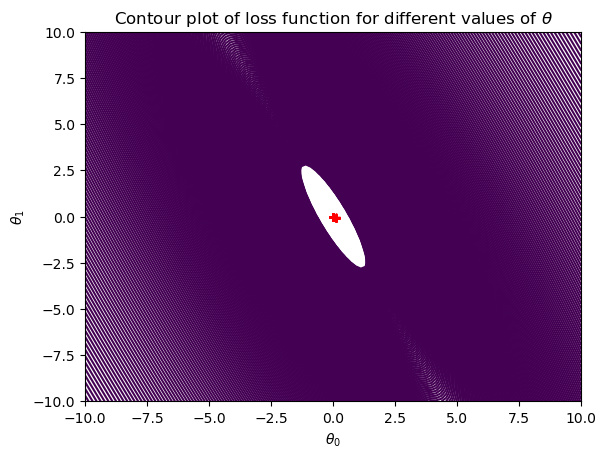

In [736]:
T0, T1 = np.meshgrid(theta0_vals, theta1_vals)  # Create 2D grid

plt.contour(T0, T1, J_vals, levels=np.logspace(0, 10, 1000))
plt.xlabel(r'$\theta_{0}$')
plt.ylabel(r'$\theta_{1}$')
plt.title("Contour plot of loss function for different values of $\\theta$")
plt.plot(theta0_history1, theta1_history1, 'r+')
plt.show()

### 2.12 Stockholm, 2020

In [739]:
#This will translate your chosen weather data into the X and y datasets needed for the optimization function.

X=index.to_numpy().reshape(n_rows,1)
#Represent x_0 as a vector of 1s for vector computation
ones = np.ones((n_rows,1))
X = np.concatenate((ones, X), axis=1)
y=dfyear2020['STOCKHOLM_temp_mean'].to_numpy().reshape(n_rows,1)


X.shape, y.shape


((366, 2), (366, 1))

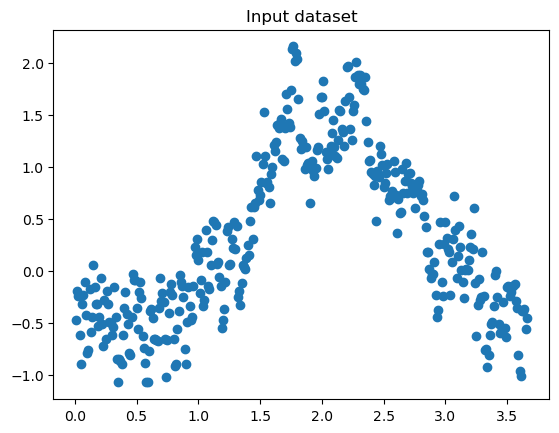

In [741]:
#Look at one year of temperature data over time
plt.scatter(x=index['index'], y=dfyear2020['STOCKHOLM_temp_mean'])
plt.title('Input dataset');
plt.show()

In [743]:
# Find min temperature
dfyear2020['STOCKHOLM_temp_mean'].min()

-1.0753039870799852

In [745]:
# Find max temperature
dfyear2020['STOCKHOLM_temp_mean'].max()

2.1592464517522667

In [747]:
# Compute loss function for the gradiant descent

def compute_cost(X, y, theta=np.array([[0],[0]])):
    """Given covariate matrix X, the prediction results y and coefficients theta
    compute the loss"""
    
    m = len(y)
    J=0 # initialize loss to zero
    
    # reshape theta
    theta=theta.reshape(2,1)
    
    # calculate the hypothesis - y_hat
    h_x = np.dot(X,theta)
    #print(h_x)
    
    # subtract y from y_hat, square and sum
    error_term = sum((h_x - y)**2)
    
    # divide by twice the number of samples - standard practice.
    loss = error_term/(2*m)
    
    return loss

In [749]:
compute_cost(X,y)

array([0.35415859])

In [751]:
# Gradient descent function

def gradient_descent(X, y, theta=np.array([[0],[0]]),
                    alpha=0.01, num_iterations=1500):
    """
    Solve for theta using Gradient Descent optimiztion technique. 
    Alpha is the learning rate
    """
    m = len(y)
    J_history = []
    theta0_history = []
    theta1_history = []
    theta = theta.reshape(2,1)
    
    for i in range(num_iterations):
        error = (np.dot(X, theta) - y)
        
        term0 = (alpha/m) * sum(error* X[:,0].reshape(m,1))
        term1 = (alpha/m) * sum(error* X[:,1].reshape(m,1))
        
        # update theta
        term_vector = np.array([[term0],[term1]])
        #print(term_vector)
        theta = theta - term_vector.reshape(2,1)
        
        # store history values
        theta0_history.append(theta[0].tolist()[0])
        theta1_history.append(theta[1].tolist()[0])
        J_history.append(compute_cost(X,y,theta).tolist()[0])
        
    return (theta, J_history, theta0_history, theta1_history)

In [753]:
%%time
#This runs the data through a gradiant descent for the starting conditions in 'theta_init.'

num_iterations= 80 
theta_init=np.array([[0],[0]]) 
alpha=0.1
theta, J_history, theta0_history, theta1_history = gradient_descent(X,y, theta_init,
                                                                   alpha, num_iterations)


theta

CPU times: total: 62.5 ms
Wall time: 69.9 ms


array([[-0.03436007],
       [ 0.18234722]])

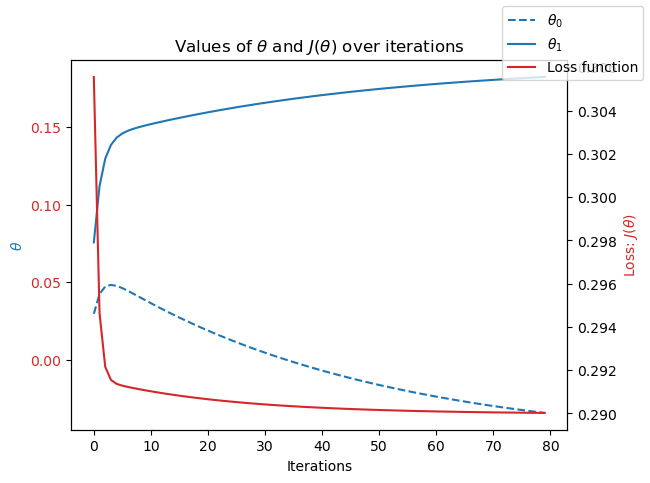

In [755]:
fig, ax1 = plt.subplots()

# plot thetas over time
color='tab:blue'
ax1.plot(theta0_history, label='$\\theta_{0}$', linestyle='--', color=color)
ax1.plot(theta1_history, label='$\\theta_{1}$', linestyle='-', color=color)
# ax1.legend()
ax1.set_xlabel('Iterations'); ax1.set_ylabel('$\\theta$', color=color);
ax1.tick_params(axis='y', labelcolor=color)

# plot loss function over time
color='tab:red'
ax2 = ax1.twinx()
ax2.plot(J_history, label='Loss function', color=color)
ax2.set_title('Values of $\\theta$ and $J(\\theta)$ over iterations')
ax2.set_ylabel('Loss: $J(\\theta)$', color=color)
ax1.tick_params(axis='y', labelcolor=color)

# ax2.legend();
fig.legend();

plt.show()

In [757]:
%%time
# theta range
theta0_vals = np.linspace(-10,10,100) 
theta1_vals = np.linspace(-10,10,100) 
                                     
J_vals = np.zeros((len(theta0_vals), len(theta1_vals)))

# compute cost for each combination of theta
c1=0; c2=0
for i in theta0_vals:
    for j in theta1_vals:
        t = np.array([i, j])
        J_vals[c1][c2] = compute_cost(X, y, t.transpose()).tolist()[0]
        c2=c2+1
    c1=c1+1
    c2=0 # reinitialize to 0

CPU times: total: 3.73 s
Wall time: 4.06 s


In [759]:
#Show loss function.

#X = Theta0
#Y - Theta1
#Z = Loss

#you can click/hold in the graph below to rotate!

fig = go.Figure(data=[go.Surface(x=theta1_vals, y=theta0_vals, z=J_vals)])
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

In [761]:
#Here is the same figure as above, with the line the loss function takes toward the minimum.

#X = Theta0
#Y - Theta1
#Z = Loss
#black line = path of loss function over the iterations.
#Find where it is closest to 0 in X and Y!

#you can click/hold in the graph below to rotate!

line_marker = dict(color='#101010', width=2)
fig = go.Figure()
fig.add_surface(x=theta1_vals, y=theta0_vals, z=J_vals)
fig.add_scatter3d(x=theta1_history, y=theta0_history, z=J_history, line=line_marker, name='')
#The below line adds a graph of just the loss over iterations in a 2D plane
plt.plot(theta0_history, theta1_history, 'r+');
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

In [763]:
#Rerun the optimisation above closer to the objective


num_iterations=10
theta_init=np.array([[0.1],[-0.1]])
alpha= 0.1 
theta1, J_history1, theta0_history1, theta1_history1 = gradient_descent(X,y, theta_init,
                                                                   alpha, num_iterations)


In [765]:
# New loss path on the function

line_marker = dict(color='#101010', width=2)
fig = go.Figure()
fig.add_surface(x=theta1_vals, y=theta0_vals, z=J_vals)
fig.add_scatter3d(x=theta1_history1, y=theta0_history1, z=J_history1, line=line_marker, name='')
#The below line adds a graph of just the loss over iterations in a 2D plane
plt.plot(theta0_history1, theta1_history1, 'r+');
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

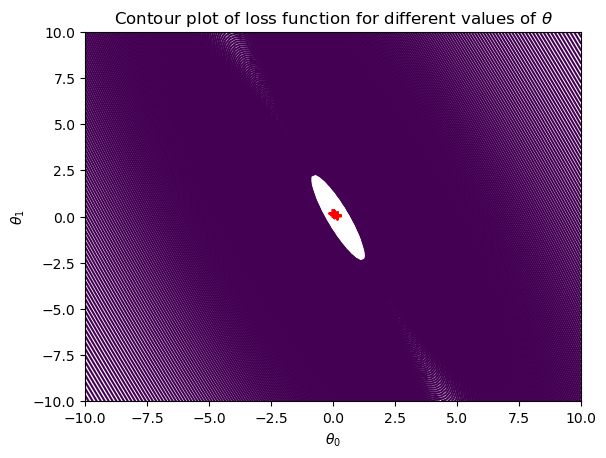

In [767]:
T0, T1 = np.meshgrid(theta0_vals, theta1_vals)  # Create 2D grid

plt.contour(T0, T1, J_vals, levels=np.logspace(0, 10, 1000))
plt.xlabel(r'$\theta_{0}$')
plt.ylabel(r'$\theta_{1}$')
plt.title("Contour plot of loss function for different values of $\\theta$")
plt.plot(theta0_history1, theta1_history1, 'r+')
plt.show()